# Own dataset for predicting resp rate from ECG
### Decided to make a regression model for creating respiratory signal from ECG

In [1]:
import random
import os
import numpy as np
import pickle
import torch
from torch import nn
import torch.nn.functional as F
import physio
from tqdm import tqdm
import neurokit2 as nk
from torch.utils.data import Dataset, DataLoader
from scipy.interpolate import interp1d
from scipy.special import softmax, log_softmax
from matplotlib import pyplot as plt
from customLib.preprocess import *
from models.models import LSTM
from customLib.peak_detection import find_mean_avg_r_peak_indices, detect_nk
from customLib.dataset import split_dataset

e:\anaconda3\envs\torch\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
root_path = ".\\aidmed_ecgs\\with_resp"
test_path = os.path.join(root_path, "test")

aidmed_ecg_sampling_rate = 250
aidmed_resp_sampling_rate = 50

device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

batch_size = 16

In [3]:
files = [x for x in os.listdir(root_path) if not os.path.isdir(root_path + "//" + x)]

ecgs = [os.path.join(root_path, x) for x in files[0::4]]
cycles =  [os.path.join(root_path, x) for x in files[1::4]]
resps =  [os.path.join(root_path, x) for x in files[2::4]]
annotations =  [os.path.join(root_path, x) for x in files[3::4]]

assert len(files) == len(ecgs) + len(resps) + len(annotations) + len(cycles)
assert (len(ecgs) + len(resps) + len(annotations) + len(cycles)) % 4 == 0

In [4]:
def shift_windows(ecg, resp, annotation, resp_cycle_annotation):
    """
    Function for shifting one of the signals if they happen to have different time stamps

    Args:
    ecg - a 2D array where the second column (index 1) is timestamps, first column (index 0) is ecg values
    resp - a 2D array where the second column (index 1) is timestamps, first column (index 0) is resp values
    annotation - a 1D array of RESP local maxima indices
    resp_cycle_annotation - a 1D array of resp cycle indices
    """
    # Accessing the timestamps correctly from index 1
    ecg_first_timestep = ecg[0, 1]
    ecg_last_timestep = ecg[-1, 1]

    resp_first_timestep = resp[0, 1]
    resp_last_timestep = resp[-1, 1]

    try:
        if ecg_first_timestep != resp_first_timestep:
            raise ValueError("start-mismatch")
        if ecg_last_timestep != resp_last_timestep:
            raise ValueError("end-mismatch")
    except ValueError as e:
        if str(e) == "start-mismatch":
            print("Start mismatch detected.")
            if ecg_first_timestep < resp_first_timestep:
                # Find index where ECG timestamps are >= the first RESP timestamp
                mismatch_idx = np.where(ecg[:, 1] >= resp_first_timestep)[0][0]
                ecg = ecg[mismatch_idx:]  # Remove earlier timestamps in ECG
            else:
                # Find index where RESP timestamps are >= the first ECG timestamp
                mismatch_idx = np.where(resp[:, 1] >= ecg_first_timestep)[0][0]
                resp = resp[mismatch_idx:]  # Remove earlier timestamps in RESP
                annotation = annotation - mismatch_idx  # Shift annotation indices
                annotation = annotation[annotation > 0]  # Keep only valid positive indices
                resp_cycle_annotation = resp_cycle_annotation - mismatch_idx
                resp_cycle_annotation = resp_cycle_annotation[resp_cycle_annotation > 0]
        elif str(e) == "end-mismatch":
            print("End mismatch detected.")
            if ecg_last_timestep < resp_last_timestep:
                # Find index where RESP timestamps are >= the last ECG timestamp
                mismatch_idx = np.where(resp[:, 1] >= ecg_last_timestep)[0][0]
                resp = resp[:mismatch_idx]  # Remove later timestamps in RESP
                annotation = annotation[annotation < mismatch_idx]  # Adjust annotation
                resp_cycle_annotation = resp_cycle_annotation[resp_cycle_annotation < mismatch_idx]
            else:
                # Find index where ECG timestamps are >= the last RESP timestamp
                mismatch_idx = np.where(ecg[:, 1] >= resp_last_timestep)[0][0]
                ecg = ecg[:mismatch_idx]  # Remove later timestamps in ECG
        else:
            raise Exception("An unknown data timestamp mismatch occurred.")
    finally:
        # Ensure resp and ecg are 1D after adjusting
        if len(ecg.shape) > 1:
            ecg = ecg[:, 0]  # Assuming first column has RESP values
        if len(resp.shape) > 1:
            resp = resp[:, 0]  # Assuming first column has ECG values

        #print("ECG shape:", ecg.shape, " Time:", ecg.shape[0] / aidmed_ecg_sampling_rate)
        #print("RESP shape:", resp.shape, " Time:", resp.shape[0] / aidmed_resp_sampling_rate)

    return ecg, resp, annotation, resp_cycle_annotation


In [5]:
def plot_ecg_resp(ecg, resp, annotation=None):
    fig, axs = plt.subplots(nrows=2)

    t_ecg = [x * 1/aidmed_ecg_sampling_rate for x in range(ecg.shape[0])]
    t_resp = [x * 1/aidmed_resp_sampling_rate for x in range(resp.shape[0])]

    ax = axs[0]
    ax.plot(t_ecg, ecg)
    ax.grid()

    ax = axs[1]
    ax.plot(t_resp, resp)
    if annotation:
        ax.plot(annotation * 1/aidmed_resp_sampling_rate, resp[annotation], 'rx')
    ax.grid()

    fig.show()

In [6]:
def prepare_x_y_windows(window_in_seconds, windows_overlap_factor=0.85):
    ecg_target_window_length = window_in_seconds * aidmed_ecg_sampling_rate
    resp_target_window_length = window_in_seconds * aidmed_resp_sampling_rate

    x, y = np.empty((0, ecg_target_window_length)), np.empty((0, resp_target_window_length, 3))

    for i, (ecg, resp, annotation, resp_cycle_annotation) in enumerate(zip(ecgs, resps, annotations, cycles)):
        ecg = np.load(ecg)
        resp = np.load(resp)

        with open(annotation, "rb") as f:
            resp_peak_indices = pickle.load(f)

        with open(resp_cycle_annotation, "rb") as f:
            resp_cycle_indices = pickle.load(f)

        ecg, resp, resp_peak_indices, resp_cycle_indices = shift_windows(ecg, resp, resp_peak_indices, resp_cycle_indices)

        # Create an annotation for the respiratory peaks
        annotation = np.zeros((resp.shape[0]))
        annotation[resp_peak_indices] = 1

        resp_cycle_annotation = np.zeros((resp.shape[0]))
        resp_cycle_annotation[resp_cycle_indices] = 1

        ecg = myConv1D(signal=ecg, kernel_length=5, padding="same")

        # Split signals into windows
        ecg_windows = split_signal(ecg, start=0, window_in_seconds=window_in_seconds, fs=aidmed_ecg_sampling_rate, overlap_factor=windows_overlap_factor, normalize=(True, (-1, 1)), denoise=False)
        resp_windows = split_signal(resp, start=0, window_in_seconds=window_in_seconds, fs=aidmed_resp_sampling_rate, overlap_factor=windows_overlap_factor, normalize=False, denoise=False)  
        annotation_windows = split_signal(annotation, start=0, window_in_seconds=window_in_seconds, fs=aidmed_resp_sampling_rate, overlap_factor=windows_overlap_factor, normalize=False, denoise=False)
        resp_cycle_annotation_windows = split_signal(resp_cycle_annotation, start=0, window_in_seconds=window_in_seconds, fs=aidmed_resp_sampling_rate, overlap_factor=windows_overlap_factor, normalize=False, denoise=False)

        ecg_windows = np.array(ecg_windows)
        resp_windows = np.array(resp_windows)

        annotation_windows = np.array(annotation_windows)
        resp_cycle_annotation_windows = np.array(resp_cycle_annotation_windows)
        full_annotation = np.stack((annotation_windows, resp_cycle_annotation_windows), axis=2)

        resp_windows = np.array(resp_windows)
        for i in range(len(resp_windows)):
            clean_resp = nk.rsp.rsp_clean(resp_windows[i], sampling_rate=50)
            resp_windows[i] = myConv1D(clean_resp, kernel_length=100, padding="same")
            resp_windows[i] = norm_min_max(resp_windows[i], 0, 1) # jensen-shannon, KLDivLoss normalize to (0,1) -> probability dist

        # KLDivLoss and jensen - shannon
        # resp_windows = softmax(resp_windows, axis=-1)
        resp_windows = log_softmax(resp_windows, axis=-1)
        resp_windows = np.expand_dims(resp_windows, -1)

        resp_and_annotation_windows = np.concatenate((resp_windows, full_annotation), axis=-1)
        
        # Concatenate ECG and respiratory windows to x and y
        x = np.concatenate((x, ecg_windows), axis=0)
        y = np.concatenate((y, np.array(resp_and_annotation_windows)), axis=0)

    return x, y


def filter_windows(x, y, window_in_seconds, resp_peaks=8, mode=""):
    """
    Filters ECG and respiratory signal windows based on the number of respiratory peaks detected 
    within each window.

    Args:
        x (np.ndarray): 
            The input array of ECG signal windows, where each window is represented as a 
            2D array of shape (num_windows, window_length).
        
        y (np.ndarray): 
            The input array of respiratory signal windows, including annotations, with a shape of 
            (num_windows, window_length, 3). The second channel contains binary values indicating 
            the presence of respiratory peaks. The third channels contains breath cycle indices.
        
        window_in_seconds (float): 
            The duration of each window in seconds, used to calculate the maximum allowed respiratory 
            peaks based on the provided peak count threshold.
        
        resp_peaks (int, optional): 
            The maximum number of respiratory peaks allowed per window. Default value is 8.
        
        mode (str, optional): 
            A string that determines the filtering condition:
            - "eq": Only includes windows with an exact match of respiratory peaks.
            - Any other value: Includes windows with respiratory peaks less than or equal to the 
              specified threshold.

    Returns:
        tuple: 
            - filtered_x (np.ndarray): The filtered ECG windows array, containing only the windows 
              that meet the specified peak count condition.
            - filtered_y (np.ndarray): The filtered respiratory windows array, corresponding to the 
              filtered ECG windows, retaining only the relevant annotations and signals.
    """
    resp_peaks_per_window = np.sum(y[:, :, 1], axis=1)  # Using the second channel for breath peaks
    peaks_count_per_window = int(resp_peaks * window_in_seconds / 60)
    
    if mode == "eq":
        filtered_x = x[resp_peaks_per_window == peaks_count_per_window]
        filtered_y = y[resp_peaks_per_window == peaks_count_per_window]
    else:
        filtered_x = x[resp_peaks_per_window <= peaks_count_per_window]
        filtered_y = y[resp_peaks_per_window <= peaks_count_per_window]

    return filtered_x, filtered_y

In [7]:
x, y = prepare_x_y_windows(window_in_seconds=60)

x_all, y_all = filter_windows(x, y, 60, resp_peaks=12)

x_8, y_8 = filter_windows(x, y, 60, resp_peaks=8, mode="eq")

Start mismatch detected.
End mismatch detected.
Start mismatch detected.
End mismatch detected.
End mismatch detected.
End mismatch detected.
Start mismatch detected.
Start mismatch detected.
End mismatch detected.
Start mismatch detected.


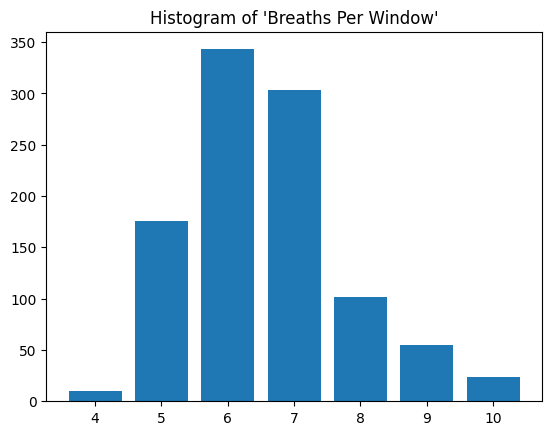

In [8]:
breaths_per_window = np.sum(y_all[:,:,1], axis=1)
histogram = dict((int(i), list(breaths_per_window).count(i)) for i in breaths_per_window)

plt.figure()
plt.bar(histogram.keys(), histogram.values())
plt.title("Histogram of 'Breaths Per Window'")
plt.show()

### Append new channel/s to ECG - RR intervals interpolation, RPA interpolation, R Peaks indices as a square wave

In [9]:
def add_new_ecg_channels(x, detector="neurokit"):
    r_peaks_prediction = np.empty((0, x.shape[1]))
    RPA = []

    if detector == "lstm":
        # Prediction using pretrained LSTM
        x = torch.tensor(x, dtype=torch.float32).unsqueeze(-1)

        assert x.dim() == 3

        num_batches = int(np.ceil(x.shape[0] / batch_size))
        model = LSTM(input_dim=1, hidden_size=32, loss_pos_weight=torch.Tensor([17]).to(device))
        model.load_state_dict(torch.load("./checkpoints/lstm/raw_ecgs/lstm_epoch_10_acc_99.88_f1_0.98.pt"))
        model.eval()

        for batch_idx in range(num_batches):
            start_idx = batch_idx * batch_size
            end_idx = min((batch_idx + 1) * batch_size, x.shape[0])

            x_batch = x[start_idx:end_idx]
            x_batch = x_batch.to(device)

            prediction = model(x_batch)
            prediction = prediction.detach().cpu().numpy()

            # vectors of peak probability in a single sample
            r_peaks_batch = (prediction >= 0.5).astype(int)
            r_peaks_batch = r_peaks_batch.reshape((r_peaks_batch.shape[0], r_peaks_batch.shape[1]))
            r_peaks_batch = np.array([find_mean_avg_r_peak_indices(x) for x in r_peaks_batch])

            r_peaks_prediction = np.concatenate((r_peaks_prediction, r_peaks_batch), axis=0)

            x_batch = x_batch.cpu().numpy()
            for example_idx, r_peaks_proba in enumerate(r_peaks_batch):
                r_peaks_indices = np.where(r_peaks_proba == 1)[0]
                ecg_amplitudes = x_batch[example_idx].flatten()[r_peaks_indices]

                assert len(r_peaks_indices) == len(ecg_amplitudes)
                RPA.append(ecg_amplitudes)

        x = x.squeeze(-1).numpy()

    elif detector == "neurokit":
        # Prediction using neurokit
        r_peaks_prediction = np.empty((0, x.shape[1]))

        for ecg in x:
            ecg_peaks_indices = detect_nk(ecg_slice=ecg, fs=aidmed_ecg_sampling_rate)
            ecg_peaks = np.zeros_like(ecg)
            ecg_peaks[ecg_peaks_indices] = 1
            ecg_peaks = np.expand_dims(ecg_peaks, 0)
            r_peaks_prediction = np.concatenate((r_peaks_prediction, ecg_peaks), axis=0)

            ecg_amplitudes = ecg[ecg_peaks_indices]

            assert len(ecg_amplitudes) == len(ecg_peaks_indices)

            RPA.append(ecg[ecg_peaks_indices])
    
    else:
        raise ValueError("Invalid detector. Choose either 'lstm' or 'neurokit'.")

    assert len(RPA) == r_peaks_prediction.shape[0]

    foh_waveform_interpolation = []
    rpa_waveform_interpolation = []

    for prediction, RPA_waveform in zip(r_peaks_prediction, RPA):
        r_peaks_idx = np.where(prediction == 1)[0]
        RRs = np.diff(r_peaks_idx) * 1/aidmed_ecg_sampling_rate * 1000

        if 0 in r_peaks_idx and (len(prediction) - 1) in r_peaks_idx:
            RRs = np.concatenate(([int(np.mean(RRs))], RRs), axis=0)

        if (len(prediction) - 1) in r_peaks_idx:
            RRs = np.concatenate((RRs, [int(np.mean(RRs))]), axis=0)

        if 0 not in r_peaks_idx:
            r_peaks_idx = np.concatenate(([0], r_peaks_idx), axis=0)
            RRs = np.concatenate(([int(np.mean(RRs))], RRs), axis=0)
            RPA_waveform = np.concatenate(([np.mean(RPA_waveform)], RPA_waveform), axis=0)

        if (len(prediction) - 1) not in r_peaks_idx:
            r_peaks_idx = np.concatenate((r_peaks_idx, [len(prediction) - 1]), axis=0)
            RRs = np.concatenate((RRs, [int(np.mean(RRs))], [int(np.mean(RRs))]), axis=0)
            RPA_waveform = np.concatenate((RPA_waveform, [np.mean(RPA_waveform)]), axis=0)

        try:
            assert len(r_peaks_idx) == len(RRs) == len(RPA_waveform)
        except:
            print(len(RRs))
            print(len(RPA_waveform))
            print(len(r_peaks_idx))
   
        foh_rrs = interp1d(r_peaks_idx, RRs, kind="linear")           
        foh_rpa = interp1d(r_peaks_idx, RPA_waveform, kind="linear")            

        t_interpolate = [x for x in range(len(prediction))]

        interpolation_rrs = foh_rrs(t_interpolate)
        interpolation_rpa = foh_rpa(t_interpolate)

        interpolation_rrs = norm_min_max(signal=interpolation_rrs, lower=0, upper=1)
        interpolation_rpa = norm_min_max(signal=interpolation_rpa, lower=0, upper=1)

        foh_waveform_interpolation.append(interpolation_rrs)
        rpa_waveform_interpolation.append(interpolation_rpa)

    foh_waveform_interpolation = np.array(foh_waveform_interpolation)
    rpa_waveform_interpolation = np.array(rpa_waveform_interpolation)

    assert x.shape == foh_waveform_interpolation.shape == rpa_waveform_interpolation.shape

    x = np.stack((x, foh_waveform_interpolation, rpa_waveform_interpolation), axis=2)
    
    return x

In [10]:
sample = 3

if sample == -1:
   sample = x_8.shape[0] - 2

neurokit_example = add_new_ecg_channels(x_8[sample:sample+1,:], detector="neurokit")
lstm_example = add_new_ecg_channels(x_8[sample:sample+1,:], detector="lstm")
resp_example = y_8[sample]

Training will be performed with: cuda:0


e:\anaconda3\envs\torch\Lib\site-packages\torch\nn\modules\rnn.py:88: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.3 and num_layers=1
  warnings.warn("dropout option adds dropout after all but last "
C:\Users\patry\AppData\Local\Temp\ipykernel_11272\2379129619.py:13: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `t

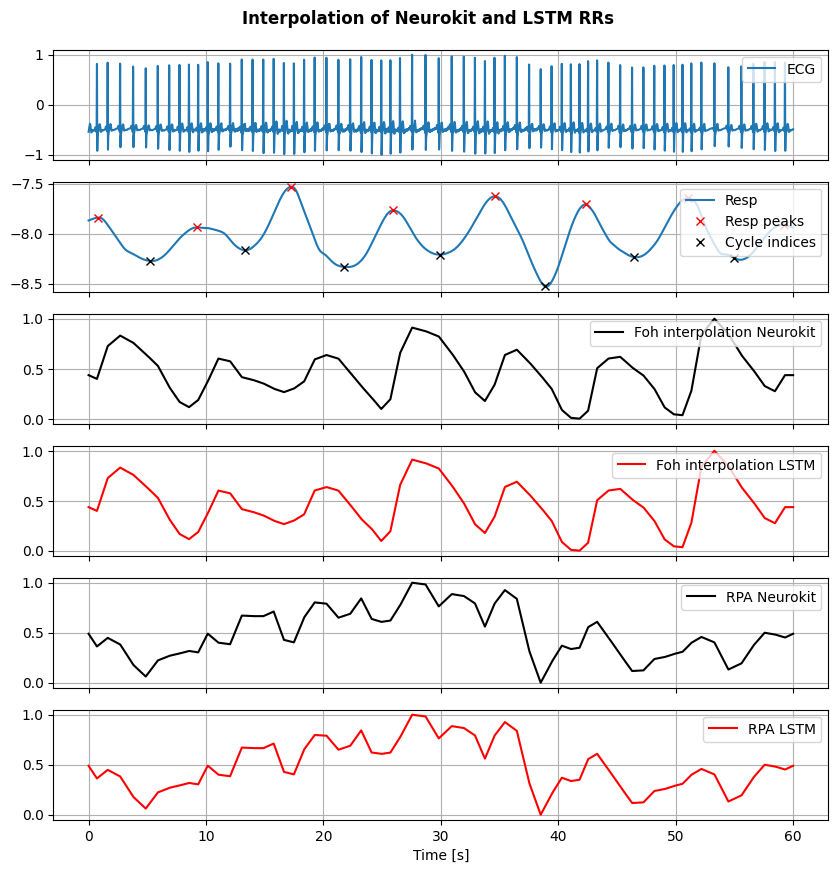

In [11]:
t_interpolate = [x * 1/ aidmed_ecg_sampling_rate for x in range(neurokit_example.shape[1])]
t = [x * 1/ aidmed_ecg_sampling_rate for x in range(neurokit_example.shape[1])]
t_resp = [x * 1/ aidmed_resp_sampling_rate for x in range(resp_example.shape[0])]

resp_peks = np.where(resp_example[:,1] == 1)[0]
resp_cycles_indices = np.where(resp_example[:,2] == 1)[0]
fig, axs = plt.subplots(nrows=6, sharex=True)

ax = axs[0]
ax.grid()
ax.plot(t, neurokit_example[:,:,0].flatten())
# ax.plot(r_peaks_nk * 1/ aidmed_ecg_sampling_rate, x[sample][r_peaks_nk], 'rx')
# ax.plot(r_peaks_lstm * 1/ aidmed_ecg_sampling_rate, x[sample][r_peaks_lstm], 'gx')
ax.legend(["ECG", "NK peaks", "LSTM peaks"], loc='upper right')

ax = axs[1]
ax.plot(t_resp, resp_example[:,0].flatten())
ax.plot(resp_peks * 1/ aidmed_resp_sampling_rate, resp_example[resp_peks,0], 'rx')
ax.plot(resp_cycles_indices * 1/ aidmed_resp_sampling_rate, resp_example[resp_cycles_indices,0], 'x', color="black")
ax.grid()
ax.legend(["Resp", "Resp peaks", "Cycle indices"], loc='upper right')

ax = axs[2]
ax.plot(t_interpolate, neurokit_example[:,:,1].flatten(), 'k-')
ax.grid()
ax.legend(["Foh interpolation Neurokit"], loc='upper right')

ax = axs[3]
ax.plot(t_interpolate, lstm_example[:,:,1].flatten(), 'r-')
ax.grid()
ax.legend(["Foh interpolation LSTM"], loc='upper right')

ax = axs[4]
ax.plot(t_interpolate, neurokit_example[:,:,2].flatten(), 'k-')
ax.grid()
ax.legend(["RPA Neurokit"], loc='upper right')

ax = axs[5]
ax.plot(t_interpolate, lstm_example[:,:,2].flatten(), 'r-')
ax.grid()
ax.legend(["RPA LSTM"], loc='upper right')

plt.xlabel("Time [s]")
fig.suptitle("Interpolation of Neurokit and LSTM RRs", x=0.5,y=0.92, fontweight="semibold")
fig.set_size_inches(10,10)

In [12]:
def jensen_shannon_divergence(p, q):
    m = 0.5 * (p + q)
    return 0.5 * (F.kl_div(F.log_softmax(p, dim=-1), m, reduction='batchmean') +
                  F.kl_div(F.log_softmax(q, dim=-1), m, reduction='batchmean'))


class EarlyStopper():
    def __init__(self, patience=1, min_delta=0):
        self.counter = 0
        self.patience = patience
        self.min_delta = min_delta
        self.min_val_loss = float('inf')

    def __call__(self, val_loss):
        if val_loss < self.min_val_loss:
            self.min_val_loss = val_loss
            self.counter = 0
        elif val_loss > (self.min_val_loss + self.min_delta):
            self.counter += 1
            if self.counter >= self.patience:
                print("Early stopping")
                return True
        return False


class NCC(nn.Module):
    def __init__(self):
        super(NCC, self).__init__()

    def forward(self, x: torch.Tensor, y: torch.Tensor) -> torch.Tensor:
        """
        Computes the normalized cross-correlation coefficient for input signals.
        The input signals x and y can be of shape [batch_size, seq_length] or [seq_length].
        Returns a mean value of the cross-correlation coefficients.
        """
        # If the input is 1D (shape [seq_length]), unsqueeze to make it 2D (shape [1, seq_length])
        if x.dim() == 1 and y.dim() == 1:
            x = x.unsqueeze(0)  # Shape becomes [1, seq_length]
            y = y.unsqueeze(0)  # Shape becomes [1, seq_length]

        # Ensure x and y have the same shape
        assert x.shape == y.shape, "X and Y must be of the same shape"

        # Compute the mean along the sequence dimension (dim=1)
        x_mean = torch.mean(x, dim=1, keepdim=True)
        y_mean = torch.mean(y, dim=1, keepdim=True)

        # Subtract the mean from the inputs
        x_prime = x - x_mean
        y_prime = y - y_mean

        # Compute the covariance
        covariance = torch.sum(x_prime * y_prime, dim=1)

        # Compute the standard deviations
        std_x = torch.sqrt(torch.sum(x_prime ** 2, dim=1))
        std_y = torch.sqrt(torch.sum(y_prime ** 2, dim=1))

        # Compute the denominator and avoid division by zero
        denominator = std_x * std_y
        r_xy = torch.where(denominator != 0, covariance / denominator, torch.zeros_like(covariance))

        # Return the mean of the cross-correlation coefficients
        return torch.mean(r_xy)



class InterpolateLayer(torch.nn.Module):
    def __init__(self, interpolate_ratio=0.2, mode='linear'):
        super(InterpolateLayer, self).__init__()
        self.interpolate_ratio = interpolate_ratio  # Ratio to downsample or upsample
        self.mode = mode
    
    def __call__(self, x):
        _, seq_length, _ = x.shape

        new_seq_length = int(self.interpolate_ratio * seq_length)
        if new_seq_length < 1:
            raise ValueError("Interpolated sequence length must be greater than 1. Got {self.interpolate_ratio} * {seq_length} = {new_seq_length}")

        x = x.permute(0,2,1)
        x = F.interpolate(x, size=new_seq_length, mode=self.mode)
        x = x.permute(0,2,1)

        return x

class RespToECG(nn.Module):
    def __init__(self, input_size=3, hidden_size=64, interpolate_ratio=0.2):
        super(RespToECG, self).__init__()

        half_hidden_size = int(hidden_size/2)

        self.lstm_1 = torch.nn.LSTM(input_size=input_size, hidden_size=hidden_size, batch_first=True, bidirectional=True, dropout=0.3)
        self.layer_norm_1 = nn.LayerNorm(2*hidden_size)

        #self.lstm_2 = torch.nn.LSTM(input_size=2*hidden_size, hidden_size=hidden_size, bidirectional=True, batch_first=True, dropout=0.3)
        #self.layer_norm_2 = nn.LayerNorm(2*hidden_size)

        self.dense_1 = torch.nn.Linear(in_features=2*hidden_size, out_features=hidden_size)
        
        self.interpolation_layer = InterpolateLayer(interpolate_ratio=interpolate_ratio)
        self.lstm_2 = torch.nn.LSTM(input_size=hidden_size, hidden_size=half_hidden_size, bidirectional=True, batch_first=True)
        self.dense_2 = torch.nn.Linear(in_features=hidden_size, out_features=1)
        
        self.to(device)

    def forward(self, x):
        x, _ = self.lstm_1(x)
        x = self.layer_norm_1(x)

        # x, _ = self.lstm_2(x)
        # x = self.layer_norm_2(x)

        x = self.dense_1(x)
        #x = torch.relu(x)

        x = self.interpolation_layer(x)
        x, _ = self.lstm_2(x)
        x = self.dense_2(x)

        x = x.squeeze(-1)

        x = F.log_softmax(x, dim=-1) # KLDivLoss
        # x = F.softmax(x, dim=-1) # jensen-shannon
        return x

In [13]:
class DeviceDataset(Dataset):
  def __init__(self, data, labels):
    super(DeviceDataset, self).__init__()
    self.data = data
    self.labels = labels
    self.device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

  def __len__(self):
    return self.data.shape[0]
  
  def __getitem__(self, idx):
    sample = torch.tensor(self.data[idx], dtype=torch.float32).to(self.device)
    label = torch.tensor(self.labels[idx], dtype=torch.float32).to(self.device)
    return sample, label

In [14]:
x_all_expanded = add_new_ecg_channels(x_all, detector="lstm")
x_train, y_train, x_val, y_val = split_dataset(x=x_all_expanded, y=y_all, is_validation_set=False, shuffle=True)


# additional training - just examples with 8 breaths per minute
x_8 = add_new_ecg_channels(x_8, detector="lstm")

# x_train = x_train[:int(x_train.shape[0] / 10),:,:]
# y_train = y_train[:int(y_train.shape[0] / 10),:,:]

#x_train = np.expand_dims(x_train, 2)
#x_test = np.expand_dims(x_test, 2)

train_dataset = DeviceDataset(data=x_train, labels=y_train)
val_dataset = DeviceDataset(data=x_val, labels=y_val)
train_8_dataset = DeviceDataset(data=x_8, labels=y_8)

train_loader = DataLoader(dataset=train_dataset, batch_size=batch_size)
val_loader = DataLoader(dataset=val_dataset, batch_size=batch_size)
train_8_loader = DataLoader(dataset=train_8_dataset, batch_size=batch_size)

Training will be performed with: cuda:0


e:\anaconda3\envs\torch\Lib\site-packages\torch\nn\modules\rnn.py:88: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.3 and num_layers=1
  warnings.warn("dropout option adds dropout after all but last "
C:\Users\patry\AppData\Local\Temp\ipykernel_11272\2379129619.py:13: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `t

Total X: 1013
Training will be performed with: cuda:0


In [15]:
def find_predicted_maxima(y_true, y_pred, seq_length, neighbourhood):
    """
    Subfunction to find predicted maxima for a signle prediction using y_true vector.
    
    Parameters:
    - y_true: A binary vector for a single batch, shape (seq_length,) where 1 indicates a local maxima.
    - y_pred: The predicted vector for the same sequence, shape (seq_length,).
    - seq_length: Length of the prediction sequence.
    - threshold: The neighborhood window around each true maxima to search for predicted maxima.
    
    Returns:
    - y_pred_maximas: A list of indices of the predicted maxima for a single prediction.
    """
    true_maximas = torch.nonzero(y_true == 1).squeeze(1)

    y_pred_maximas = []
    for maxima in true_maximas:
        start_idx = int(max(0, maxima - neighbourhood))
        end_idx = int(min(seq_length, maxima + neighbourhood))
        maxima_idx = torch.argmax(y_pred[start_idx:end_idx]) + start_idx
        y_pred_maximas.append(maxima_idx)

    return y_pred_maximas

def calculate_peak_misalignment(y_true, y_pred, neighbourhood=200, sampling_rate=50):
    """
    Function for calculating the sum of peak misalignment for batch sequences.
    The pred local maximas are calculated using y_true vector.
    y_true is a binary matrix of shape (batch_size, seq_length) where 1 indicates a local maxima.
    y_pred is a predicted matrix of shape (batch_size, seq_length) with predicted values.
    neighbourhood is the number of samples around a true maxima to search for a predicted maxima.
    """
    batch_size, seq_length = y_true.shape
    
    total_misalignment_sum = 0.0

    for batch_idx in range(batch_size):
        y_i = y_true[batch_idx]
        y_pred_i = y_pred[batch_idx]

        true_maximas = torch.nonzero(y_i == 1).squeeze(1)
        y_pred_maximas = find_predicted_maxima(y_i, y_pred_i, seq_length, neighbourhood=neighbourhood)

        if len(true_maximas) == 0 or len(y_pred_maximas) == 0:
            continue

        # Convert y_pred_maximas to a tensor
        y_pred_maximas = torch.tensor(y_pred_maximas, device=y_true.device)

        # Calculate the misalignment (difference between true and predicted maxima positions)
        misalignments = true_maximas - y_pred_maximas

        # Convert misalignment to time using the sampling rate
        misalignment_time = misalignments.float() / sampling_rate

        # Sum the misalignments for the current sequence and add it to the total
        total_misalignment_sum += misalignment_time.abs().sum().item()

    return total_misalignment_sum

In [16]:
def find_resp_maxima(y, sampling_rate=50):
    try:
        y = norm_min_max(y, -1, 1)
        resp_peaks = nk.rsp_findpeaks(y, sampling_rate=sampling_rate)['RSP_Peaks']
        return resp_peaks
    except:
        return np.empty((0,))

def calculate_peak_misalignment(y_true, y_pred, sampling_rate=50):
    """
    Function for calculating the sum of peak misalignment for batch sequences.
    The pred local maximas are calculated using y_true vector.
    y_true is a binary matrix of shape (batch_size, seq_length) where 1 indicates a local maxima.
    y_pred is a predicted matrix of shape (batch_size, seq_length) with predicted values.
    Threshold is the number of samples around a true maxima to search for a predicted maxima.
    """
    y_true = y_true.detach().cpu().numpy()
    y_pred = y_pred.detach().cpu().numpy()

    batch_size, _ = y_true.shape
    
    total_misalignment_sum = 0.0
    total_target_resp_peaks = 0
    total_pred_resp_peaks = 0

    for batch_idx in range(batch_size):
        y_i = y_true[batch_idx]
        y_pred_i = y_pred[batch_idx]

        target_resp_peaks = find_resp_maxima(y_i, sampling_rate=sampling_rate)
        pred_resp_peaks = find_resp_maxima(y_pred_i, sampling_rate=sampling_rate)

        if len(target_resp_peaks) == 0:
            continue

        total_target_resp_peaks += len(target_resp_peaks)
        total_pred_resp_peaks += len(pred_resp_peaks)

        if len(target_resp_peaks) == len(pred_resp_peaks):
            total_misalignment_sum += np.sum(np.abs(total_target_resp_peaks - total_pred_resp_peaks))
        else:
            total_misalignment_sum += 0

    return total_misalignment_sum, total_target_resp_peaks, total_pred_resp_peaks


def get_resp_cycles(y, cycle_indices):
    """
    Function for returning subtensors (cycles of respiration) from y.
    y -> tensor of shape [batch_size x seq_length] (contains only respiration signal).
    cycle_indices -> tensor of shape [batch_size x seq_length] (contains only cycle indices).
    """
    cycles = []

    for batch_idx in range(y.shape[0]):
        cycle_indices_i = cycle_indices[batch_idx, :]
        cycle_indices_i = torch.where(cycle_indices_i == 1)[0]

        # No cycles found
        if cycle_indices_i.numel() == 0:
            continue  

        for (start_i, end_i) in zip(cycle_indices_i[0::2], cycle_indices_i[1::2]):
            cycle = y[batch_idx, start_i:end_i]
            cycles.append(cycle)

    return cycles


def calculate_cycle_alignment(y_true, y_pred):
    """
    Function for calculating the cycle alignment for batch sequences.
    y_pred is a predicted matrix of shape (batch_size, seq_length) with predicted values.
    y_true is a matrix of shape (batch_size, seq_length, channels) where the last channel stores cycle indices.
    """
    # Extract cycle indices and true respiration values
    cycle_indices = y_true[:, :, 2]  # (batch_size, seq_length) - last channel stores cycle indices
    true_resp_values = y_true[:, :, 0]  # True respiration signal (first channel)

    true_cycles = get_resp_cycles(true_resp_values, cycle_indices)
    pred_cycles = get_resp_cycles(y_pred, cycle_indices)

    criterion = NCC()

    metric_value = 0.0
    cycle_count = 0

    for true_cycle, pred_cycle in zip(true_cycles, pred_cycles):
        # Ensure the predicted cycle and true cycle have matching lengths
        if true_cycle.shape == pred_cycle.shape:
            metric_value += criterion(true_cycle, pred_cycle).item()
            cycle_count += 1

    return metric_value / cycle_count if cycle_count > 0 else 0.0


def get_cycle_indices(y: np.array, sampling_rate=50) -> list[list[int]]:
    if y.ndim == 1:
        y = np.reshape(y, (1, len(y)))

    all_mean_index = []

    for batch_idx in range(y.shape[0]):
        try:
            resp = norm_min_max(y[batch_idx], -1, 1)
            _, resp_cycles = physio.compute_respiration(resp, srate=sampling_rate, parameter_preset='human_airflow')
            inspi_index = resp_cycles['inspi_index'].values
            expi_index = resp_cycles['expi_index'].values
            mean_index = ((inspi_index + expi_index) / 2)
            all_mean_index.append(np.array(mean_index, dtype=int))
        except:
            all_mean_index.append(np.array([]))
        
    return all_mean_index


def calculate_cycle_time_deviation(y_true, y_pred, sampling_rate):
    time_deviation = 0.0
    cycle_count = 0

    y_true = y_true.detach().cpu().numpy()
    y_pred = y_pred.detach().cpu().numpy()

    # cycle_indices = y_true[:, :, 2]  # (batch_size, seq_length) - last channel stores cycle indices
    true_resp_values = y_true[:, :, 0]  # True respiration signal (first channel)

    true_cycle_indices = get_cycle_indices(true_resp_values)
    pred_cycle_indices = get_cycle_indices(y_pred)

    for true_indices, pred_indices in zip(true_cycle_indices, pred_cycle_indices):
        if len(true_indices) == len(pred_indices) and len(true_indices) != 0:
            time_deviation += np.sum(np.abs(np.array(true_indices) - np.array(pred_indices)))
            cycle_count += len(true_indices) - 1

    if cycle_count > 0:
        return time_deviation / cycle_count / sampling_rate, cycle_count
    else:
        return 0, 0

In [17]:
kernel_size = 51
padding_amount = (kernel_size - 1) // 2
smoothening_kernel = torch.FloatTensor([[[1/kernel_size for _ in range(kernel_size)]]]).to(device)

def plot_result(title, inputs, targets, outputs):
    rand_idx = random.randint(0, inputs.shape[0] - 1)
    input = inputs[rand_idx].detach().cpu().numpy()
    ecg = input[:, 0]
    rrs = input[:, 1]
    rpa = input[:, 2]

    target = targets[rand_idx][:,0]
    target = target.detach().cpu().numpy()

    label_peaks = targets[rand_idx][:,1]
    label_peaks = label_peaks.detach().cpu().numpy()

    resp_regression = outputs[rand_idx]
    resp_regression = resp_regression.detach().cpu().numpy()
    resp_regression = myConv1D(resp_regression, kernel_length=50, padding="same")

    # rpeaks, info = nk.ecg_peaks(ecg, sampling_rate=1000)
    # ecg_rate = nk.ecg_rate(rpeaks, sampling_rate=aidmed_ecg_sampling_rate, desired_length=len(ecg))
    # edr = nk.ecg_rsp(ecg_rate, sampling_rate=aidmed_ecg_sampling_rate)
    # edr = resample_signal(signal=edr, num_samples=len(target))
    # edr = norm_min_max(edr, lower=0, upper=1)

    # resp_regression_maximas = find_predicted_maxima(torch.tensor(resp_peaks), torch.tensor(resp_regression), resp_regression.shape[0], neighbourhood=200)
    # resp_regression_maximas_proba = np.zeros_like(resp_regression)
    # resp_regression_maximas_proba[np.array(resp_regression_maximas)] = 1

    #target_maximas = find_resp_maxima(y=target, sampling_rate=aidmed_resp_sampling_rate)
    target_maximas = targets[rand_idx][:,1].cpu().numpy().astype(int)
    target_maximas = np.where(target_maximas == 1)[0]
    pred_maximas = find_resp_maxima(y=resp_regression, sampling_rate=aidmed_resp_sampling_rate)

    target_cycle_indices = get_cycle_indices(target, aidmed_resp_sampling_rate)[0]
    pred_cycle_indices = get_cycle_indices(resp_regression, aidmed_resp_sampling_rate)[0]

    resp_peaks = np.zeros_like(resp_regression)
    resp_peaks[target_maximas] = 1

    pred_peaks = np.zeros_like(resp_regression)
    if len(pred_maximas) > 0:
        pred_peaks[pred_maximas] = 1

    fig, axs = plt.subplots(nrows=3, sharex=True)

    t_ecg = np.array([x * 1/aidmed_ecg_sampling_rate for x in range(len(ecg))])
    t_resp = np.array([x * 1/aidmed_resp_sampling_rate for x in range(len(target))])
    
    
    ax = axs[0]
    ax.plot(t_ecg, ecg.flatten(), color="#1f77b4")
    ax.plot(t_ecg, rrs.flatten(), color="#ff2800", linewidth=2.5)
    ax.plot(t_ecg, rpa.flatten(), color="#2ca02c", linewidth=2.5)
    ax.grid()
    ax.legend(["ECG", "RRIs", "RPA"])

    ax = axs[1]
    ax.plot(t_resp, target.flatten(), 'red')
    ax.plot(t_resp, resp_regression.flatten(), 'blue')
    if len(target_cycle_indices) > 0:
        ax.plot(t_resp[target_cycle_indices], target.flatten()[target_cycle_indices], 'o', color="green")
    
    if len(pred_cycle_indices) > 0:
        ax.plot(t_resp[pred_cycle_indices], resp_regression.flatten()[pred_cycle_indices], 'o', color="yellow")

    # ax.plot(t_resp, edr.flatten(), 'b-')
    ax.legend(["Target", "Regression", "Target idx", "Regress idx"])
    ax.grid()

    ax = axs[2]
    ax.plot(t_resp, resp_peaks.flatten(), 'red')
    ax.plot(t_resp, pred_peaks.flatten(), 'blue')
    #ax.plot(t_resp, edr.flatten(), 'b-')
    ax.legend(["Peaks", "Pred maximas"])
    ax.grid()

    fig.suptitle(title, fontweight="semibold")
    fig.set_size_inches(8,8)
    fig.supxlabel("Time [s]", fontweight="semibold")
    plt.show()


def validate(epoch, model, val_loader, alfa=0.5):
    model.eval()  # Set the model to evaluation mode
    criterion_1 = nn.L1Loss()
    # NCC(), nn.KLDivLoss(reduction="batchmean") (not really usefull here, when comparing a period of 60 sec breath)
    # criterion_2 = nn.CosineEmbeddingLoss()
    criterion_2 = nn.KLDivLoss(reduction="batchmean", log_target=True)
    metric_criterion = NCC()

    epoch_val_loss = 0.0
    epoch_kldiv_loss = 0.0
    epoch_l1_loss = 0.0

    metric_value = 0.0

    with torch.no_grad():  # Disable gradient calculation
        for batch_idx, (inputs, targets) in enumerate(val_loader):
            # Forward pass
            outputs = model(inputs)

            if epoch > 7:
                outputs = outputs.unsqueeze(-1)
                outputs = outputs.permute((0,2,1))
                outputs = F.conv1d(outputs, weight=smoothening_kernel)
                outputs = F.pad(outputs, (padding_amount, padding_amount), mode='replicate')
                outputs = outputs.permute((0,2,1))
                outputs = outputs.squeeze(-1)

            # Compute the loss
            loss_1 = criterion_1(outputs, targets[:,:,0])
            loss_2 = criterion_2(outputs, targets[:,:,0])

            metric_value += metric_criterion(outputs, targets[:,:,0])

            # similarity_tensor = torch.tensor([1 for _ in range(targets.shape[0])]).to(device)
            # loss_2 = criterion_2(outputs, targets[:,:,0], similarity_tensor)

            # loss = (1-alfa) * loss_1 + alfa * (1 - loss_2) # NCE

            loss = (1-alfa) * loss_1 + alfa * loss_2 # cosine, KLDivLoss

            # loss = (1-alfa) * loss_1 + alfa * jensen_shannon_divergence(outputs, targets[:,:,0])

            epoch_l1_loss += loss_1.item()
            epoch_kldiv_loss += loss_2.item()
            epoch_val_loss += loss.item()
            # a, b, c = calculate_peak_misalignment(targets[:,:,1], outputs)

            # if epoch > 7:
            #     a, b, c = calculate_peak_misalignment(targets[:,:,0], outputs)
            #     peak_misalignment += a
            #     total_target_resp_peaks += b
            #     total_pred_resp_peaks += c
            #     d, e = calculate_cycle_time_deviation(targets, outputs, 50)
            #     cycle_time_deviation += d
            #     matching_cycles += e

            if batch_idx == len(val_loader) - 1:
                plot_result(f"Epoch {epoch + 1} - validation", inputs, targets, outputs)

    return epoch_val_loss / len(val_loader), epoch_l1_loss / len(val_loader), epoch_kldiv_loss / len(val_loader), metric_value / len(val_loader)

def train(model, train_loader, val_loader, epochs=20, learning_rate=0.001, alfa=0.2):
    criterion_1 = nn.L1Loss()
    # NCC(), nn.KLDivLoss(reduction="batchmean")
    # criterion_2 = nn.CosineEmbeddingLoss()
    criterion_2 = nn.KLDivLoss(reduction="batchmean", log_target=True)

    metric_criterion = NCC()

    early_stopper = EarlyStopper(patience=3, min_delta=1e-5)

    optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate)
    scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=20, gamma=0.1)
    torch.cuda.empty_cache()

    metrics = {
        "train": {
            "loss": {
                "L1": [],
                "KLDivLoss": [],
                "sum": []
            } , 
            "NCC": []
        } , 
        "val": {
            "loss": {
                "L1": [],
                "KLDivLoss": [],
                "sum": []
            } , 
            "NCC": []
        }
    }

    for epoch in range(epochs):
        model.train()
        epoch_train_loss = 0.0
        epoch_kldiv_loss = 0.0
        epoch_l1_loss = 0.0
        metric_value = 0.0

        for batch_idx, (inputs, targets) in tqdm(enumerate(train_loader), total=len(train_loader)):
            optimizer.zero_grad()

            outputs = model(inputs)

            if epoch > 7:
                outputs = outputs.unsqueeze(-1)
                outputs = outputs.permute((0,2,1))
                outputs = F.conv1d(outputs, weight=smoothening_kernel)
                outputs = F.pad(outputs, (padding_amount, padding_amount), mode='replicate')
                outputs = outputs.permute((0,2,1))
                outputs = outputs.squeeze(-1)

            loss_1 = criterion_1(outputs, targets[:,:,0])
            loss_2 = criterion_2(outputs, targets[:,:,0])

            metric_value += metric_criterion(outputs, targets[:,:,0]).item()

            # similarity_tensor = torch.tensor([1 for _ in range(targets.shape[0])]).to(device)
            # loss_2 = criterion_2(outputs, targets[:,:,0], similarity_tensor)

            # loss = (1-alfa) * loss_1 + alfa * (1 - loss_2) # NCE
            loss = (1 - alfa) * loss_1 + alfa * loss_2 # cosine, KLDivLoss
            

            # loss = (1-alfa) * loss_1 + alfa * jensen_shannon_divergence(outputs, targets[:,:,0])

            loss.backward()
            optimizer.step()

            if batch_idx == len(train_loader) - 1:
                plot_result(f"Epoch {epoch + 1} - train", inputs, targets, outputs)
            
            epoch_l1_loss += loss_1.item()
            epoch_kldiv_loss += loss_2.item()
            epoch_train_loss += loss.item()

            # a, b, c = calculate_peak_misalignment(targets[:,:,1], outputs)

            # if epoch > 7:
            #     a, b, c = calculate_peak_misalignment(targets[:,:,0], outputs)
            #     peak_misalignment += a
            #     total_target_resp_peaks += b
            #     total_pred_resp_peaks += c
            #     d, e = calculate_cycle_time_deviation(targets, outputs, 50)
            #     cycle_time_deviation += d
            #     train_matching_cycles += e

            # cycle_alignment = calculate_cycle_alignment(targets, outputs)

        scheduler.step()
        
        avg_val_loss, avg_l1_val_loss, avg_kldiv_val_loss, val_ncc = validate(epoch, model, val_loader, alfa=alfa)

        avg_train_loss = epoch_train_loss / len(train_loader)
        avg_kldiv_train_loss = epoch_kldiv_loss / len(train_loader)
        avg_l1_train_loss = epoch_l1_loss / len(train_loader)

        train_ncc = metric_value / len(train_loader)

        metrics["train"]["loss"]["L1"].append(avg_l1_train_loss)
        metrics["train"]["loss"]["KLDivLoss"].append(avg_kldiv_train_loss)
        metrics["train"]["loss"]["sum"].append(avg_train_loss)
        metrics["train"]["NCC"].append(train_ncc)

        metrics["val"]["loss"]["L1"].append(avg_l1_val_loss)
        metrics["val"]["loss"]["KLDivLoss"].append(avg_kldiv_val_loss)
        metrics["val"]["loss"]["sum"].append(avg_val_loss)
        metrics["val"]["NCC"].append(val_ncc)

        print(f'Epoch [{epoch+1}/{epochs}], LR: {scheduler.get_last_lr()}')
        print(f"Avg train loss: {avg_train_loss:<8.6f}  |  Avg validation loss: {avg_val_loss:<8.6f}\n"
              f"Train NCC: {train_ncc:<6.4f} | Val NCC: {val_ncc:<6.4f}")
            #   f"Train peak misalignment: {peak_misalignment:<6.4f} | Val peak misalignment: {val_peak_misalignment:<6.4f}\n"
            #   f"L1 Train peak detected ratio: {train_peak_detected:<6.4f} | L1 Val peak detected ratio: {val_peak_detected:<6.4f}\n"
            #   #f"Train avg cycle alignment: {cycle_alignment:<6.4f}"
            #   f"Train cycle time deviation: {train_cycle_time_deviation:<6.4f} | Val cycle time deviation: {val_cycle_time_deviation:<6.4f}\n"
            #   f"Train matching cycles count: {train_matching_cycles:<6} | Val matching cycles count: {val_matching_cycles:<6}"
            #   )

        if early_stopper(avg_val_loss):
            break
    
    return model, metrics

In [18]:
model = RespToECG(input_size=x_train.shape[2], interpolate_ratio=0.2)

 98%|█████████▊| 50/51 [00:10<00:00,  4.95it/s]

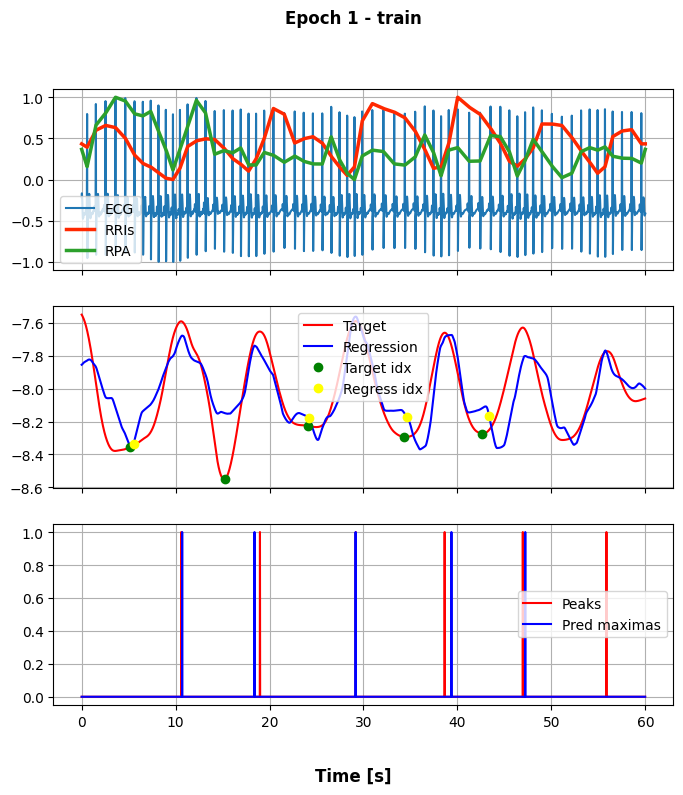

100%|██████████| 51/51 [00:11<00:00,  4.51it/s]


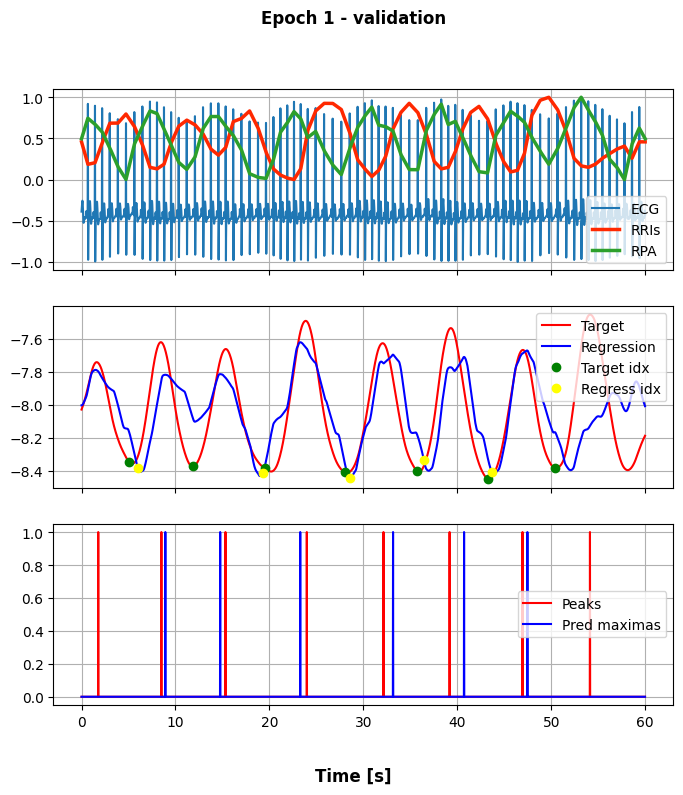

Epoch [1/30], LR: [0.001]
Avg train loss: 0.030354  |  Avg validation loss: 0.018801
Train NCC: 0.4365 | Val NCC: 0.7085


 98%|█████████▊| 50/51 [00:10<00:00,  4.95it/s]

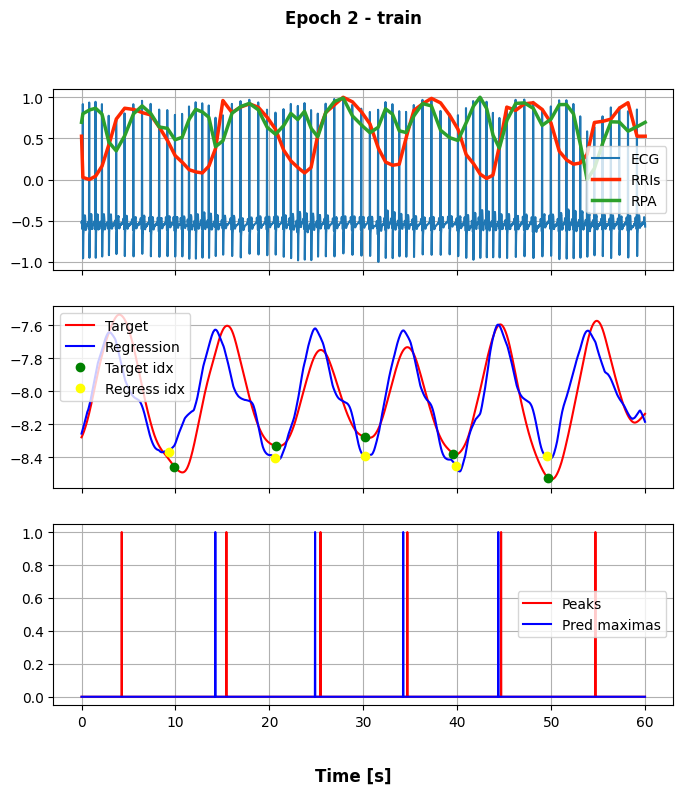

100%|██████████| 51/51 [00:10<00:00,  4.70it/s]


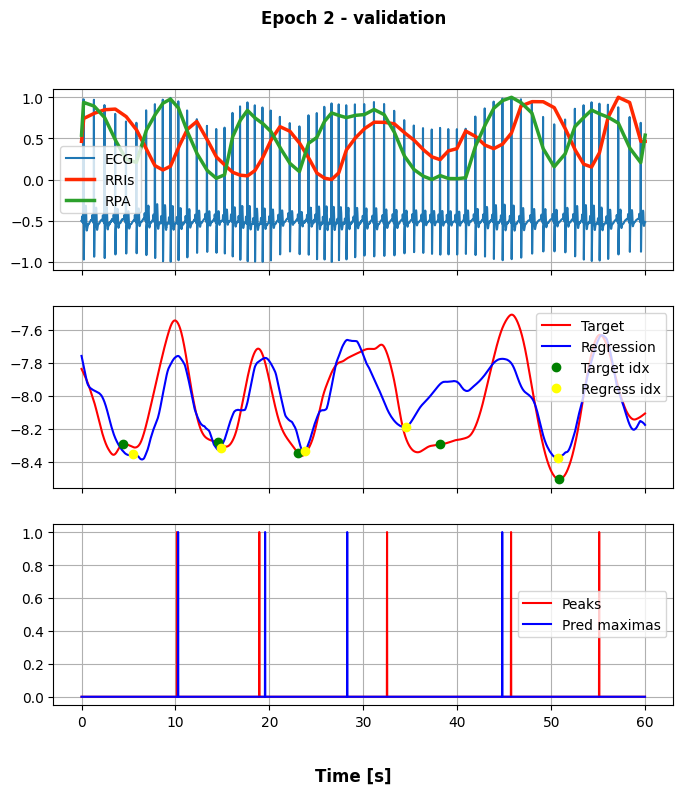

Epoch [2/30], LR: [0.001]
Avg train loss: 0.015867  |  Avg validation loss: 0.013890
Train NCC: 0.7662 | Val NCC: 0.7925


 98%|█████████▊| 50/51 [00:10<00:00,  4.98it/s]

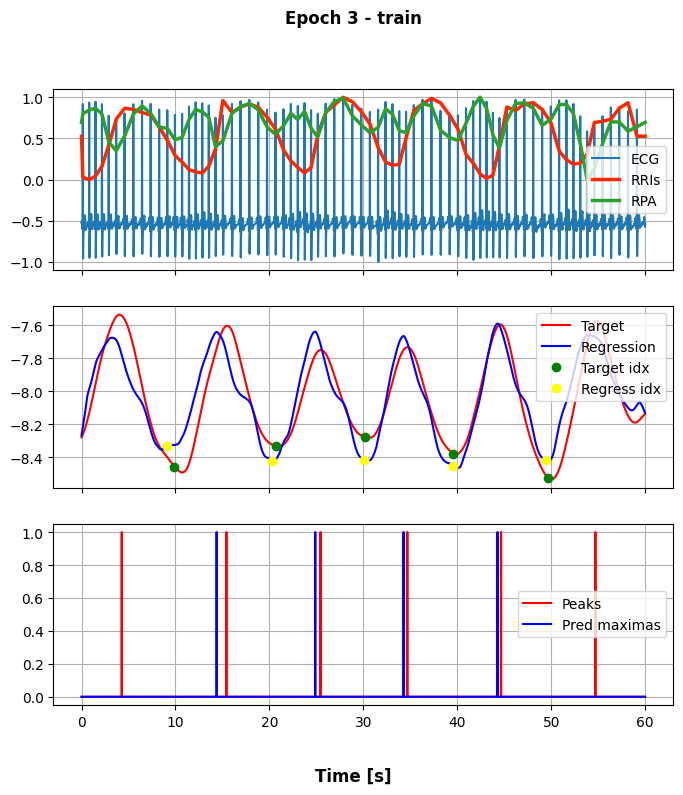

100%|██████████| 51/51 [00:10<00:00,  4.69it/s]


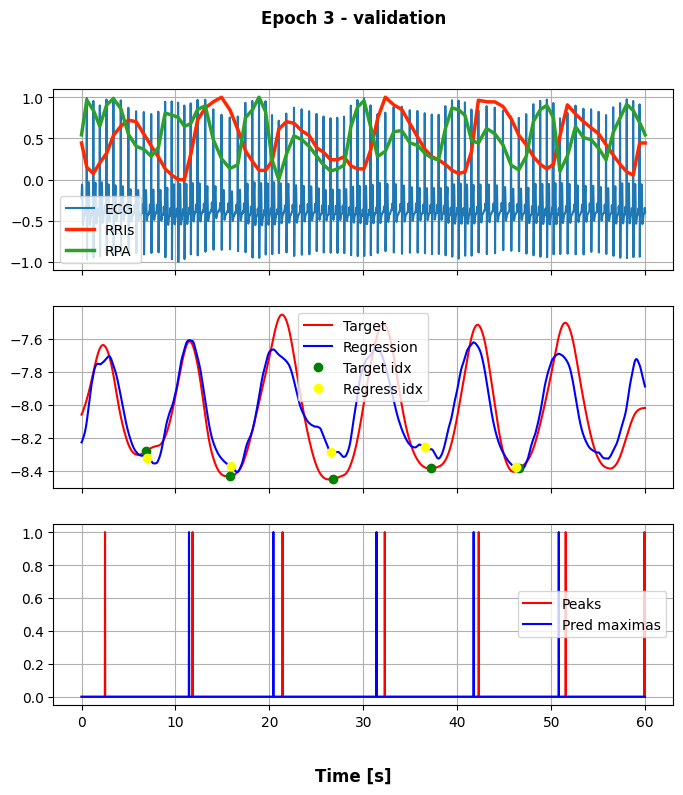

Epoch [3/30], LR: [0.001]
Avg train loss: 0.011862  |  Avg validation loss: 0.011733
Train NCC: 0.8274 | Val NCC: 0.8277


 98%|█████████▊| 50/51 [00:10<00:00,  4.98it/s]

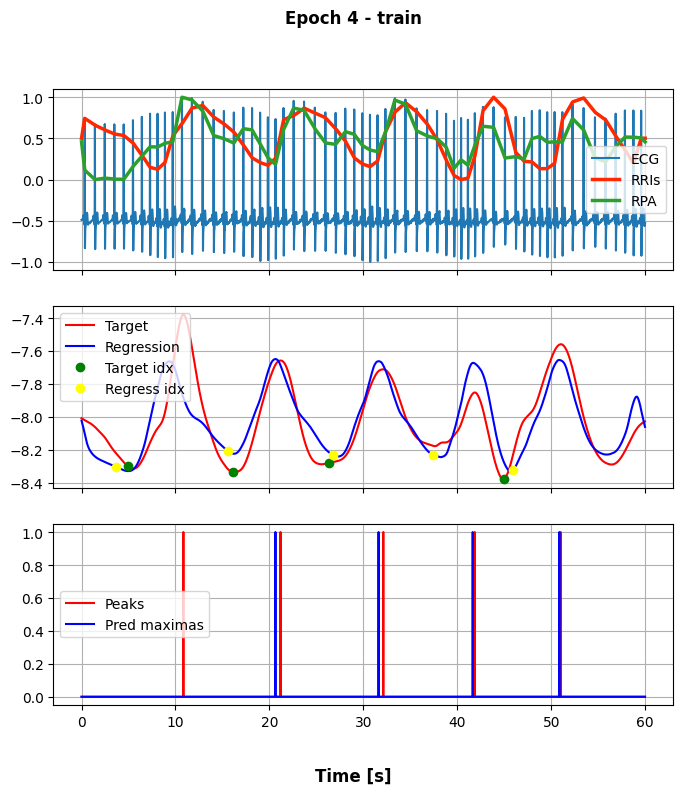

100%|██████████| 51/51 [00:10<00:00,  4.75it/s]


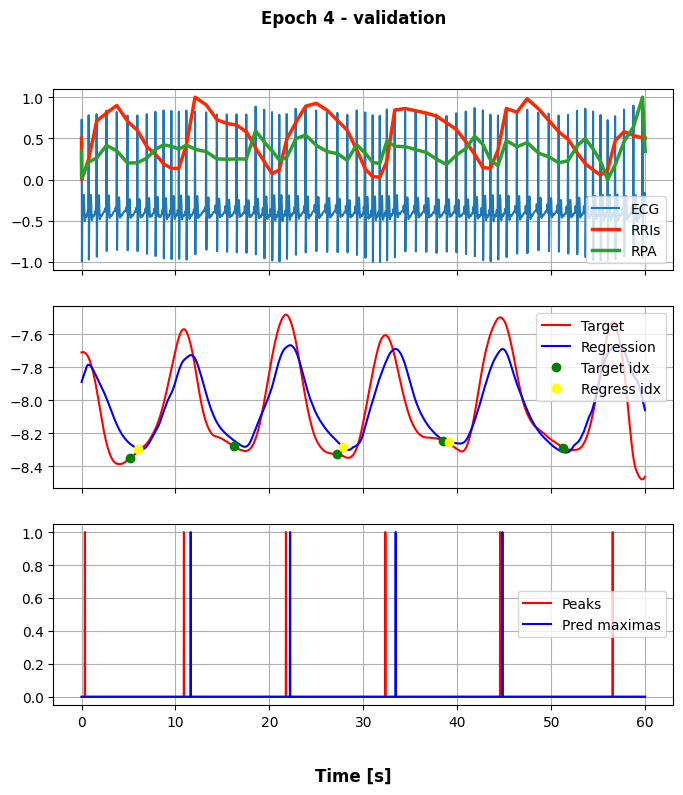

Epoch [4/30], LR: [0.001]
Avg train loss: 0.010727  |  Avg validation loss: 0.011360
Train NCC: 0.8450 | Val NCC: 0.8319


 98%|█████████▊| 50/51 [00:10<00:00,  4.91it/s]

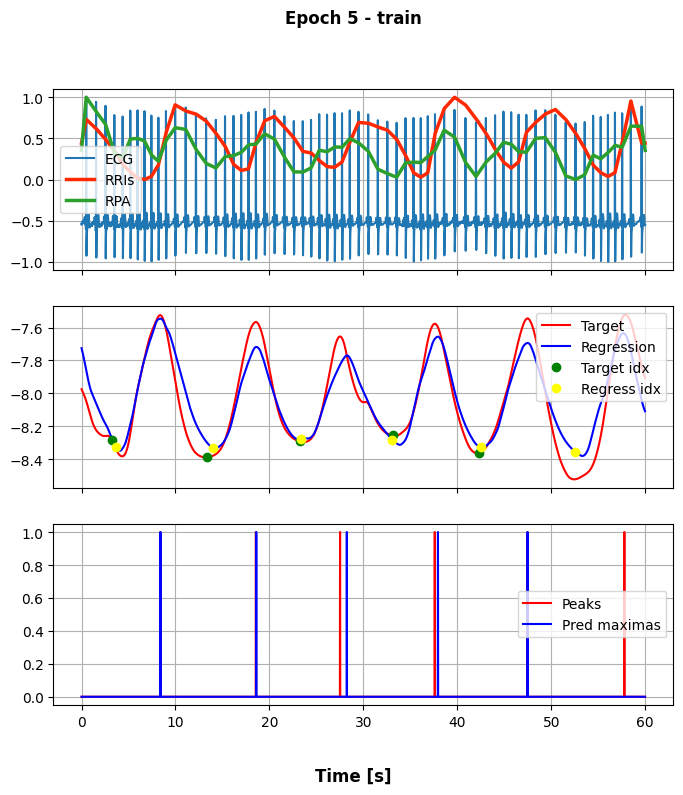

100%|██████████| 51/51 [00:10<00:00,  4.71it/s]


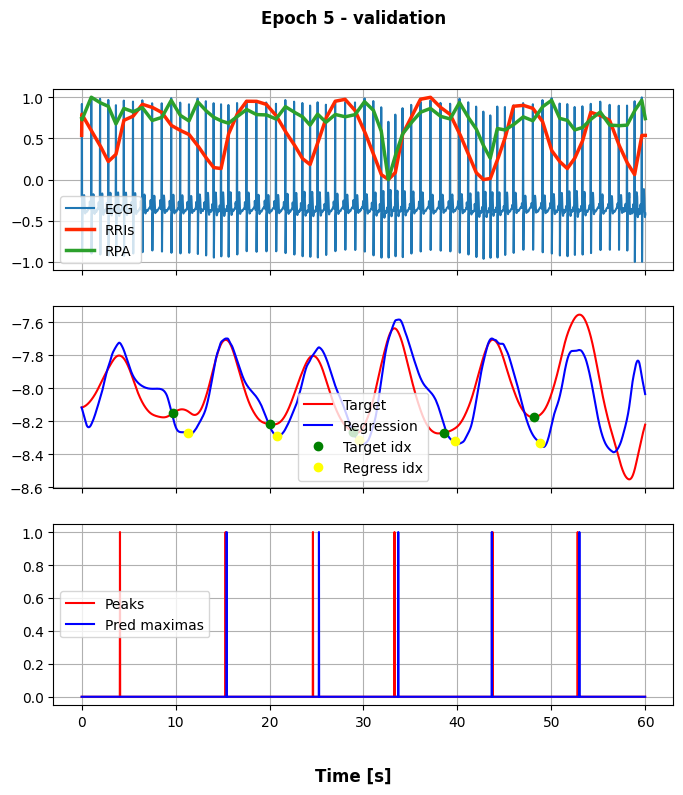

Epoch [5/30], LR: [0.001]
Avg train loss: 0.009912  |  Avg validation loss: 0.010414
Train NCC: 0.8584 | Val NCC: 0.8477


 98%|█████████▊| 50/51 [00:10<00:00,  4.99it/s]

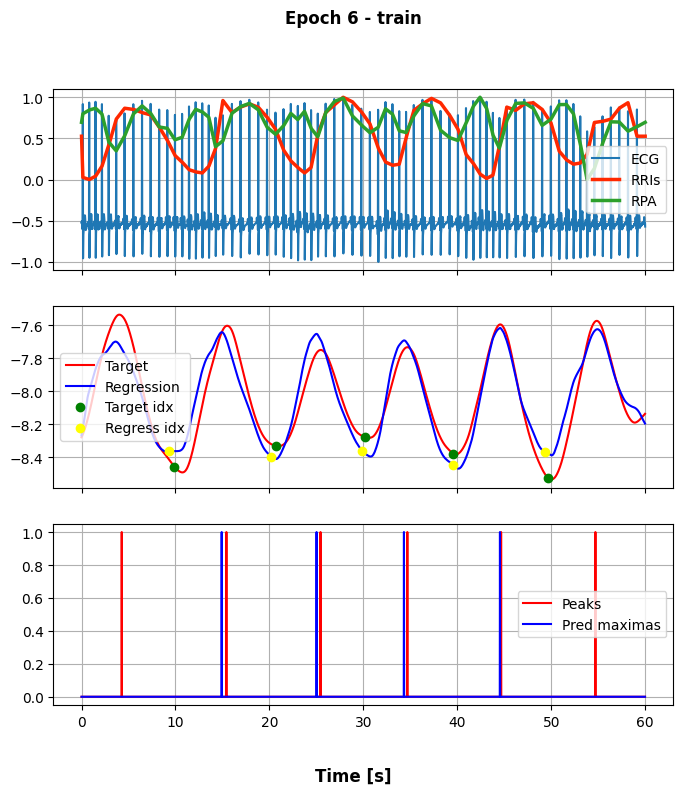

100%|██████████| 51/51 [00:10<00:00,  4.73it/s]


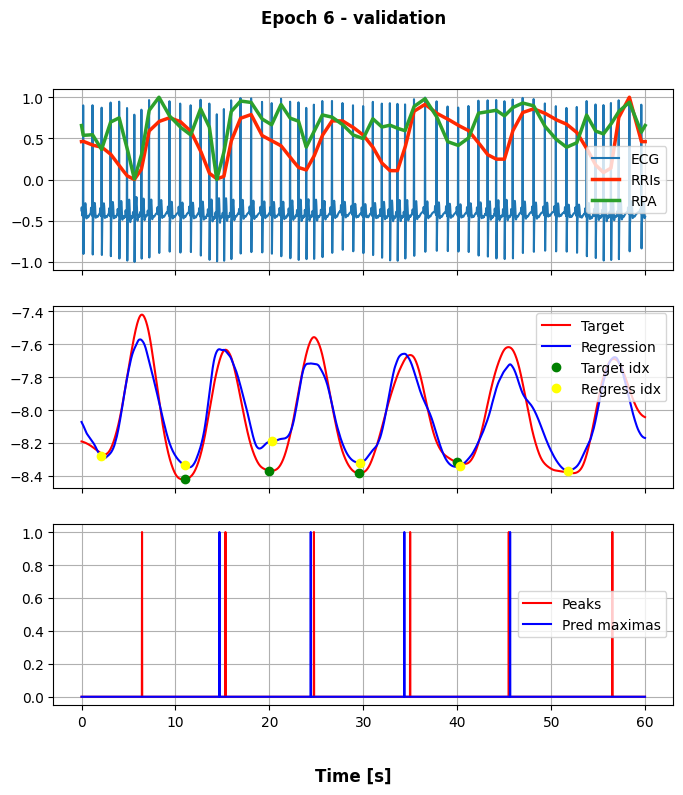

Epoch [6/30], LR: [0.001]
Avg train loss: 0.009356  |  Avg validation loss: 0.010165
Train NCC: 0.8663 | Val NCC: 0.8514


 98%|█████████▊| 50/51 [00:10<00:00,  4.95it/s]

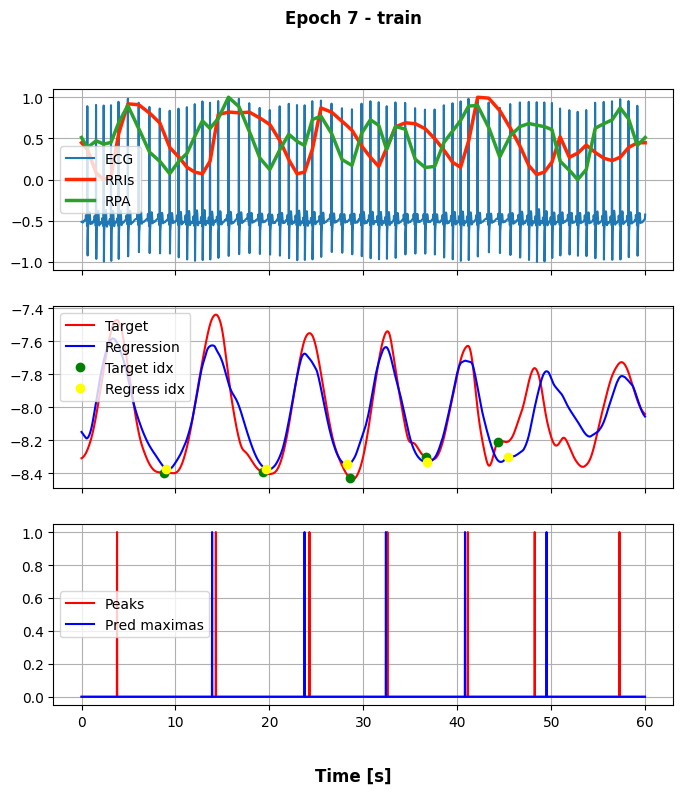

100%|██████████| 51/51 [00:10<00:00,  4.70it/s]


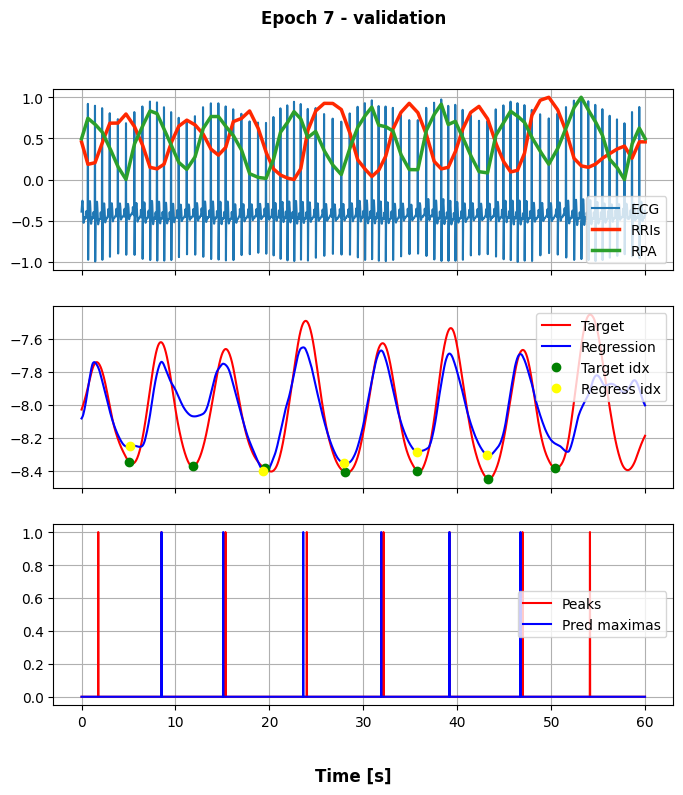

Epoch [7/30], LR: [0.001]
Avg train loss: 0.009020  |  Avg validation loss: 0.009823
Train NCC: 0.8714 | Val NCC: 0.8591


 98%|█████████▊| 50/51 [00:10<00:00,  4.96it/s]

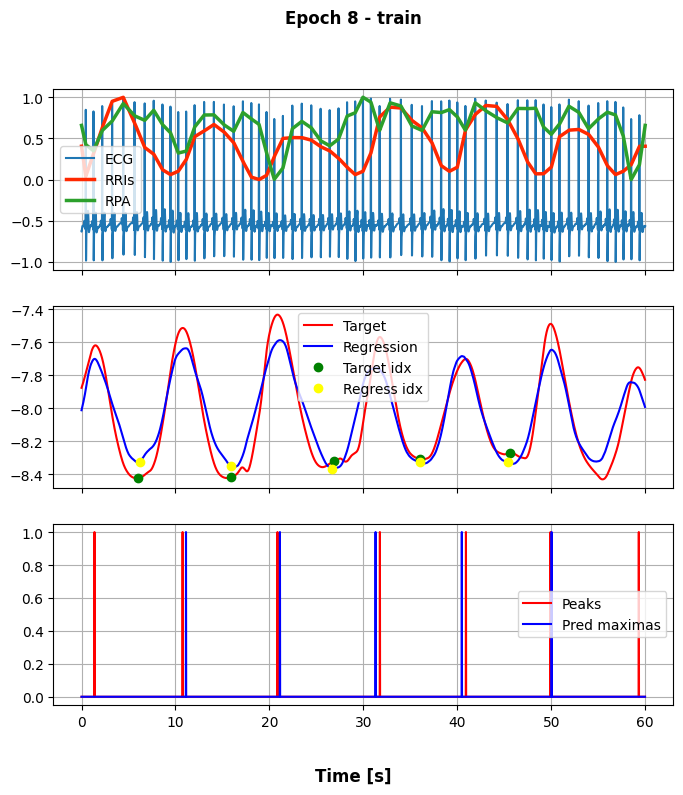

100%|██████████| 51/51 [00:10<00:00,  4.74it/s]


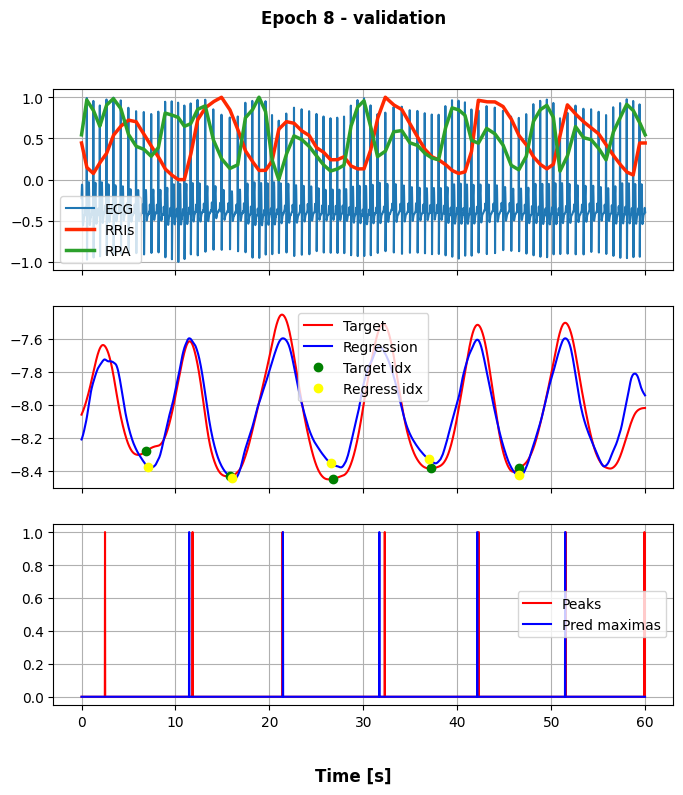

Epoch [8/30], LR: [0.001]
Avg train loss: 0.008678  |  Avg validation loss: 0.009688
Train NCC: 0.8766 | Val NCC: 0.8621


 98%|█████████▊| 50/51 [00:10<00:00,  4.94it/s]

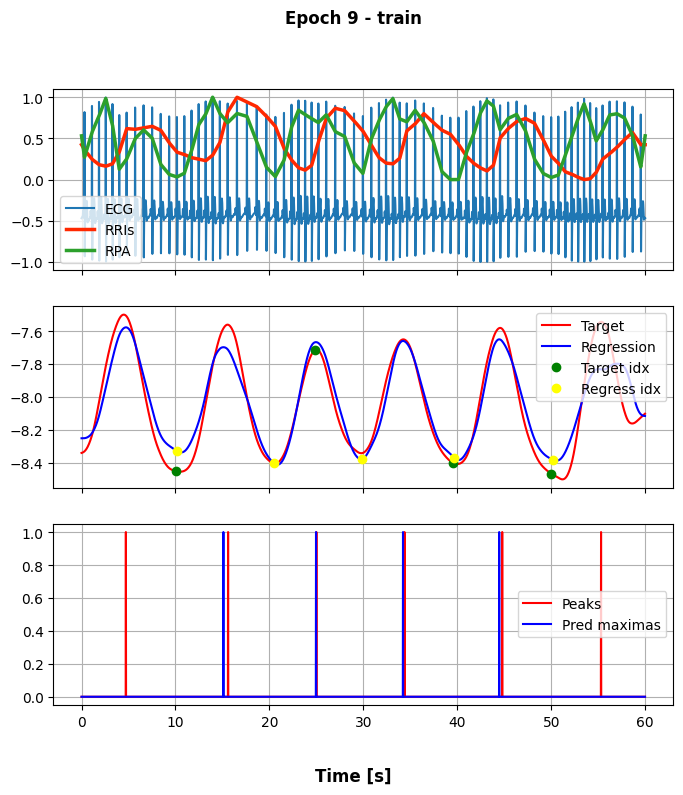

100%|██████████| 51/51 [00:11<00:00,  4.56it/s]


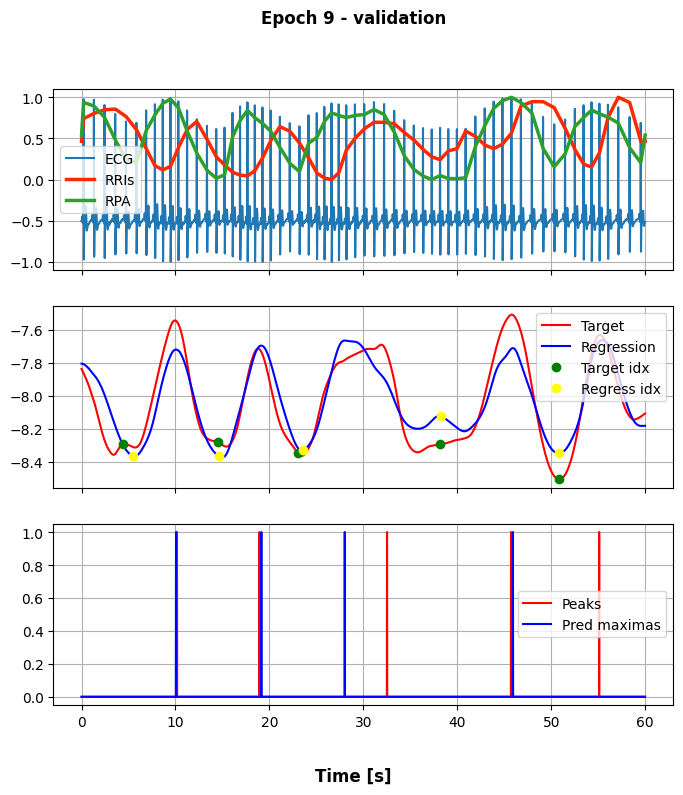

Epoch [9/30], LR: [0.001]
Avg train loss: 0.009496  |  Avg validation loss: 0.010546
Train NCC: 0.8836 | Val NCC: 0.8670


 98%|█████████▊| 50/51 [00:10<00:00,  4.92it/s]

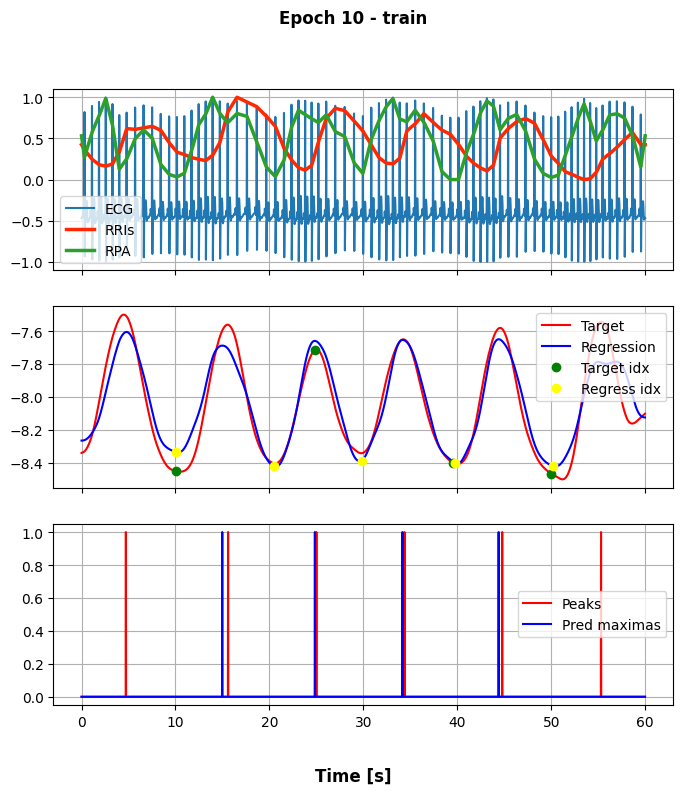

100%|██████████| 51/51 [00:10<00:00,  4.65it/s]


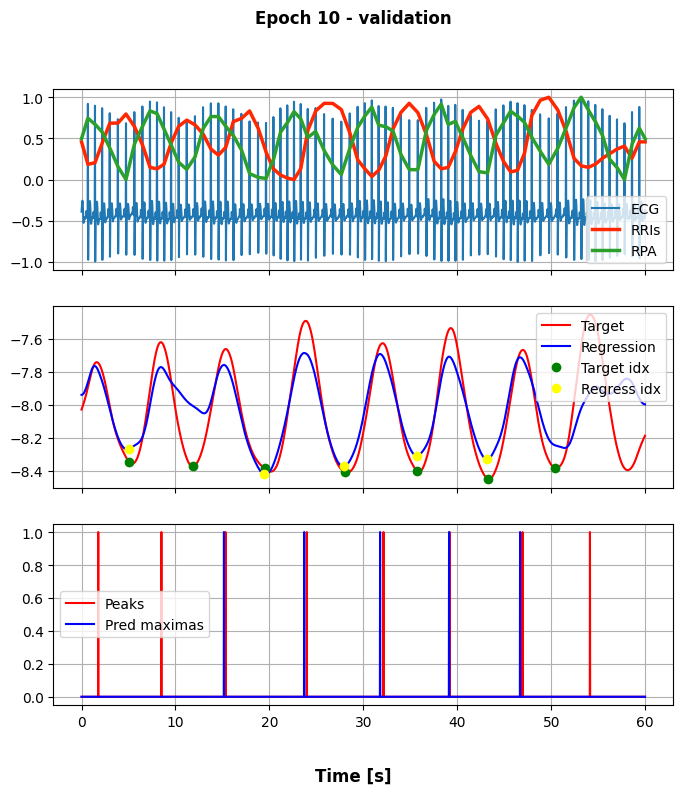

Epoch [10/30], LR: [0.001]
Avg train loss: 0.009230  |  Avg validation loss: 0.010097
Train NCC: 0.8857 | Val NCC: 0.8712


 98%|█████████▊| 50/51 [00:10<00:00,  4.88it/s]

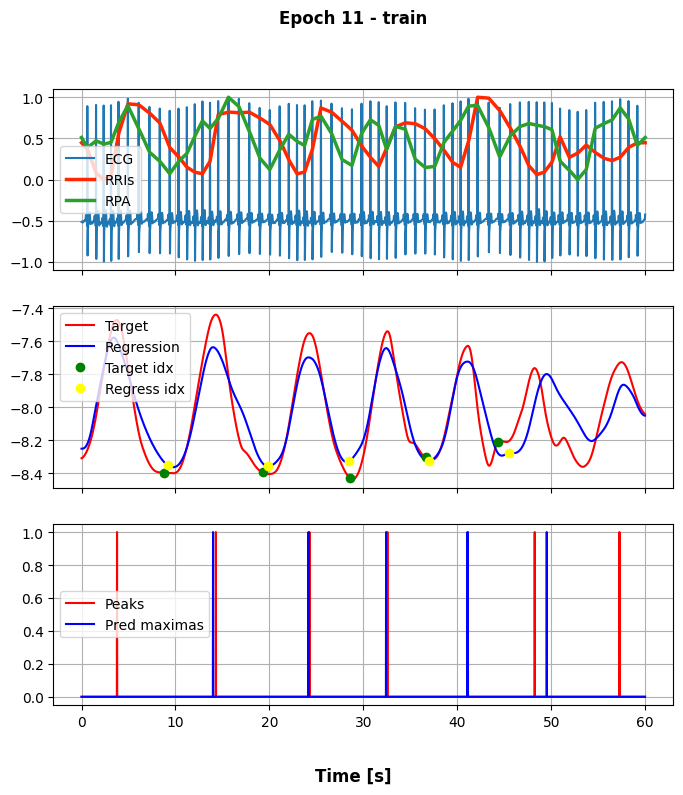

100%|██████████| 51/51 [00:10<00:00,  4.66it/s]


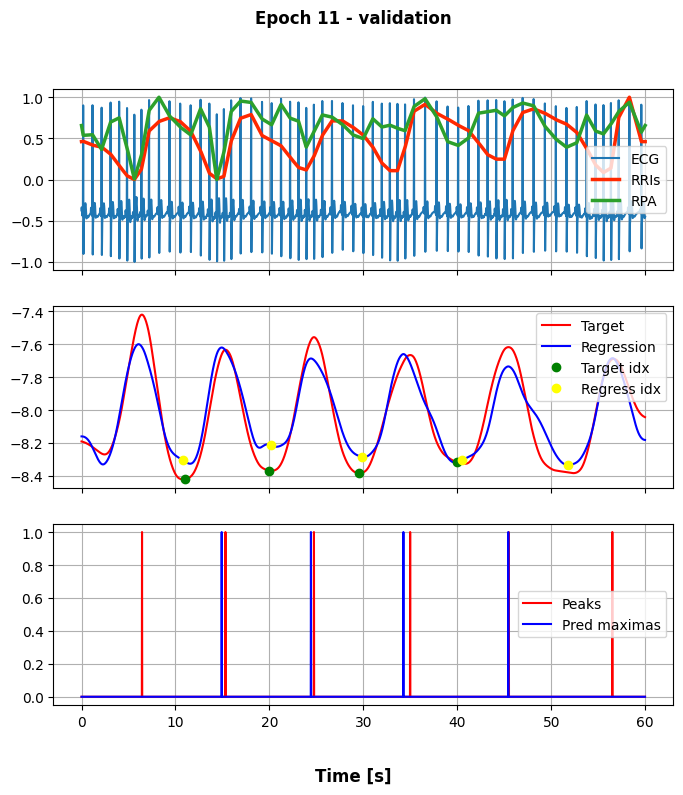

Epoch [11/30], LR: [0.001]
Avg train loss: 0.008935  |  Avg validation loss: 0.010102
Train NCC: 0.8896 | Val NCC: 0.8728
Early stopping


In [19]:
model, metrics = train(model, train_loader, val_loader, learning_rate=0.001, epochs=30, alfa=1)

 86%|████████▌ | 6/7 [00:01<00:00,  4.59it/s]

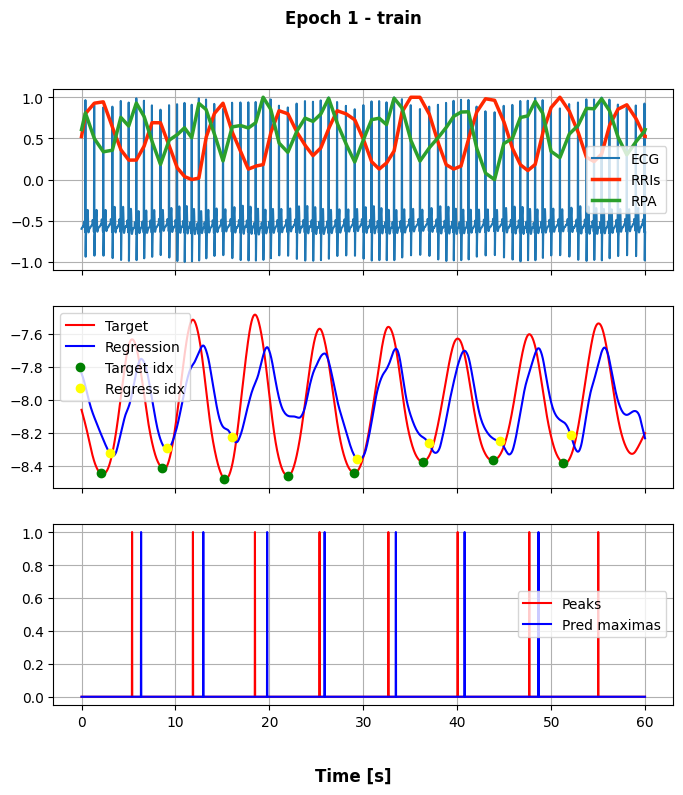

100%|██████████| 7/7 [00:02<00:00,  3.14it/s]


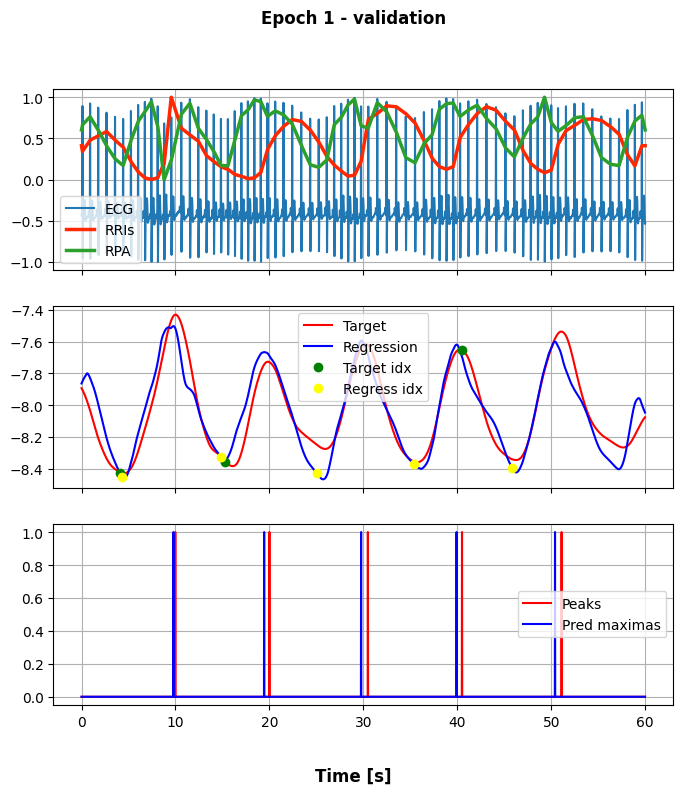

Epoch [1/10], LR: [0.001]
Avg train loss: 0.012275  |  Avg validation loss: 0.011460
Train NCC: 0.8046 | Val NCC: 0.8370


 86%|████████▌ | 6/7 [00:01<00:00,  4.98it/s]

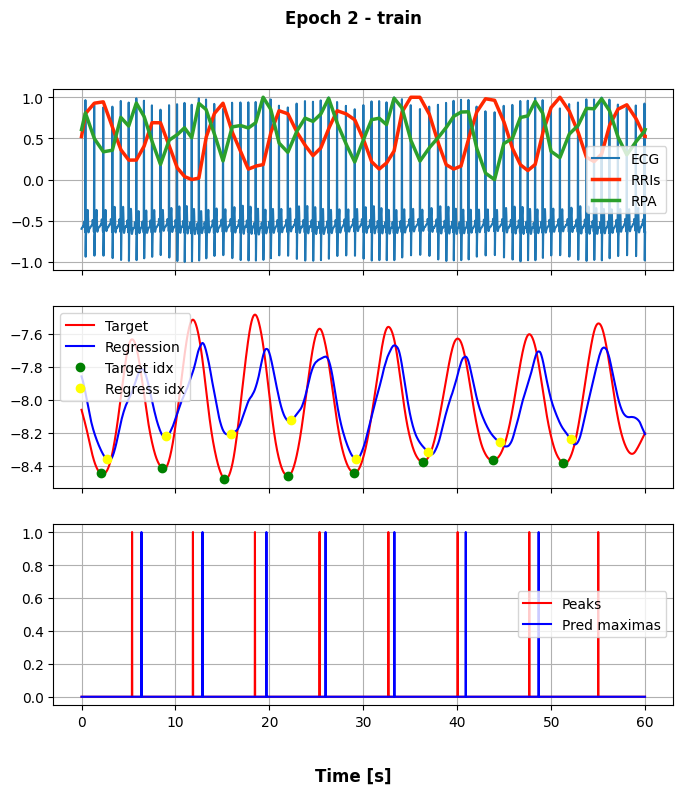

100%|██████████| 7/7 [00:01<00:00,  3.65it/s]


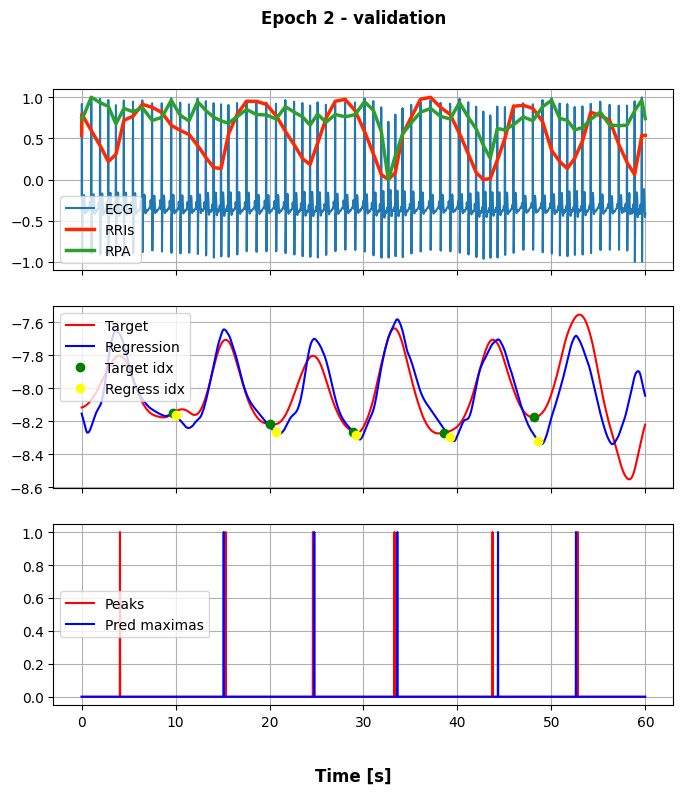

Epoch [2/10], LR: [0.001]
Avg train loss: 0.010561  |  Avg validation loss: 0.010837
Train NCC: 0.8354 | Val NCC: 0.8491


 86%|████████▌ | 6/7 [00:01<00:00,  4.93it/s]

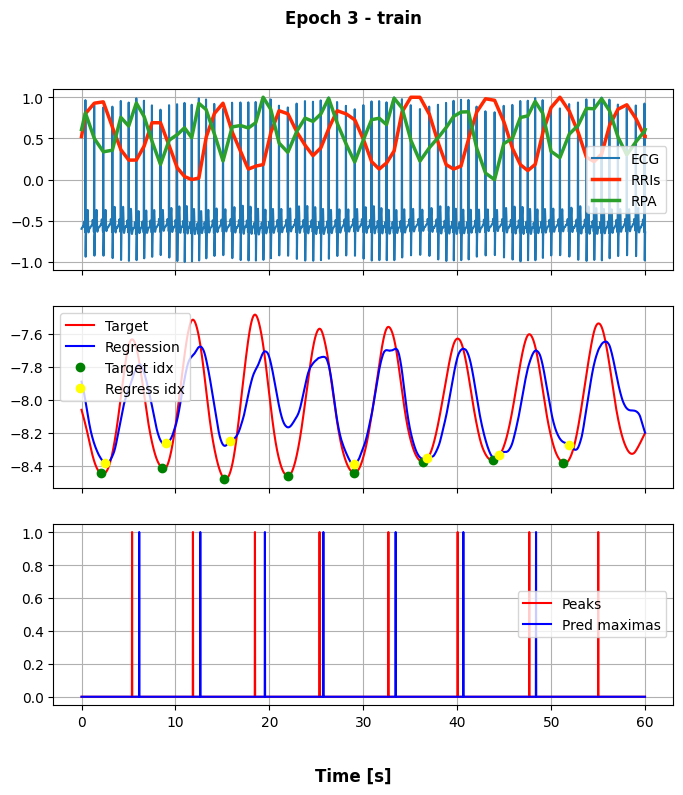

100%|██████████| 7/7 [00:01<00:00,  3.70it/s]


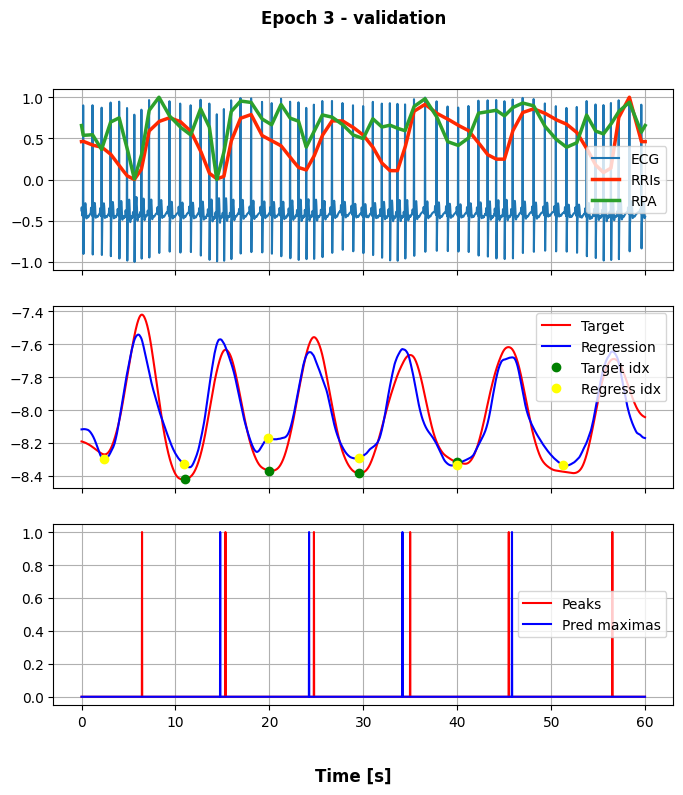

Epoch [3/10], LR: [0.001]
Avg train loss: 0.008391  |  Avg validation loss: 0.010461
Train NCC: 0.8680 | Val NCC: 0.8531


 86%|████████▌ | 6/7 [00:01<00:00,  4.92it/s]

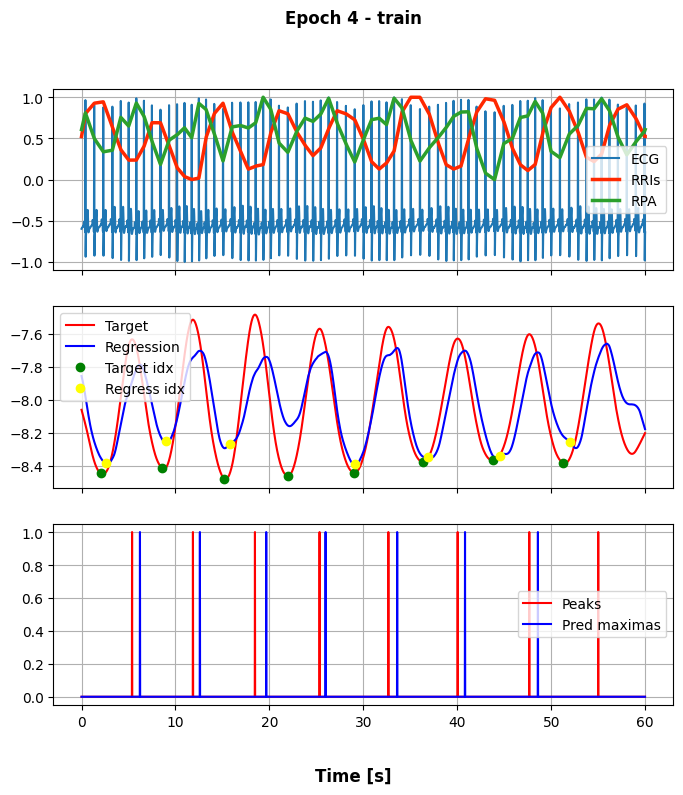

100%|██████████| 7/7 [00:01<00:00,  3.66it/s]


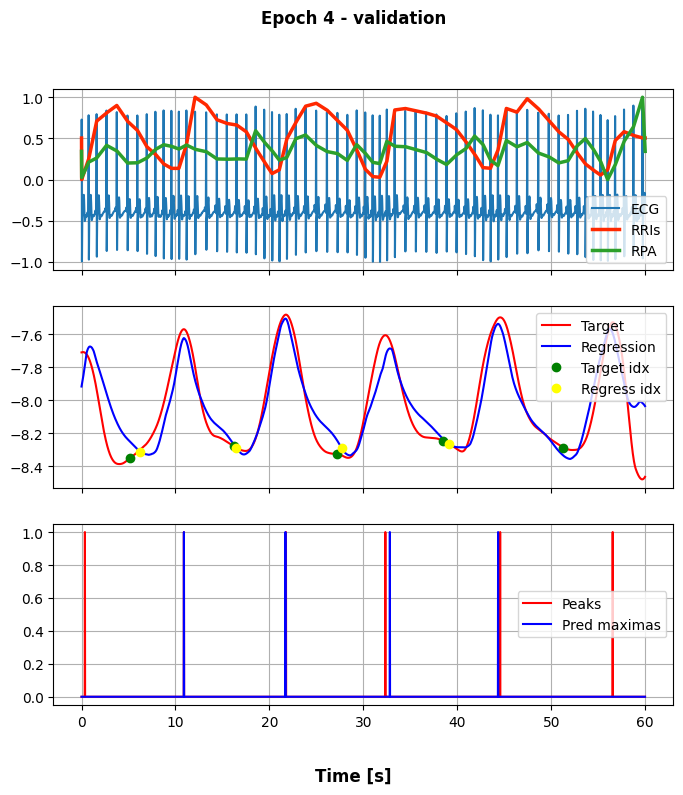

Epoch [4/10], LR: [0.001]
Avg train loss: 0.008179  |  Avg validation loss: 0.010166
Train NCC: 0.8720 | Val NCC: 0.8574


 86%|████████▌ | 6/7 [00:01<00:00,  4.98it/s]

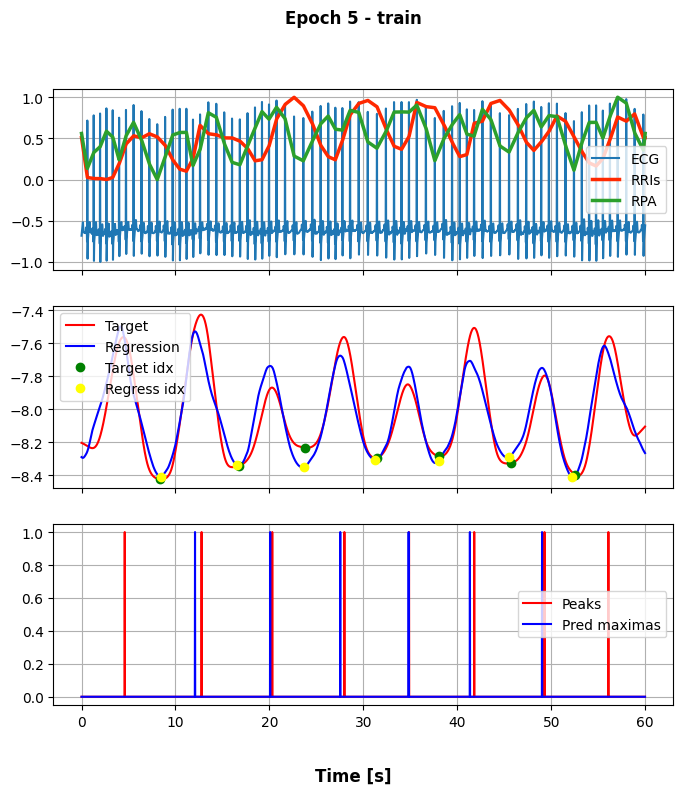

100%|██████████| 7/7 [00:01<00:00,  3.55it/s]


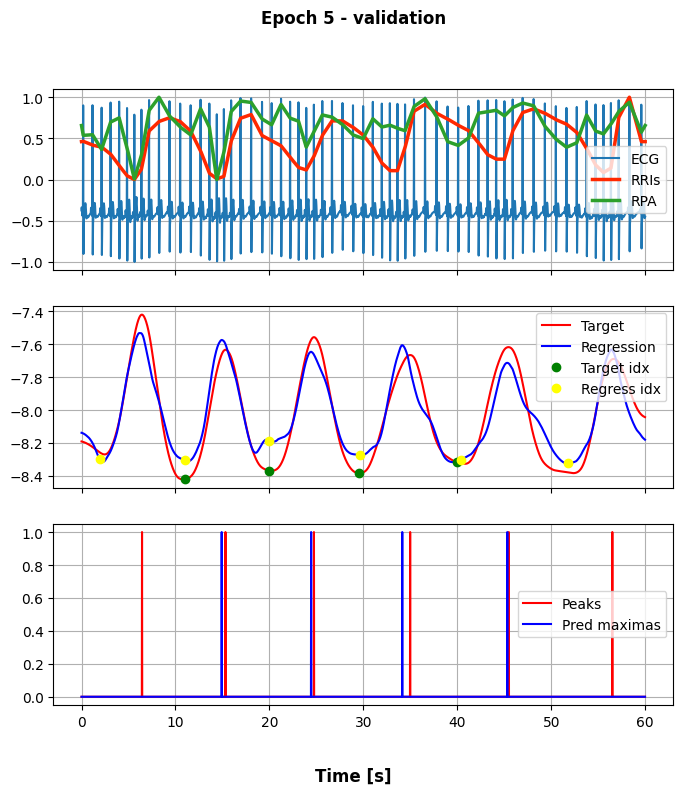

Epoch [5/10], LR: [0.001]
Avg train loss: 0.008212  |  Avg validation loss: 0.010425
Train NCC: 0.8733 | Val NCC: 0.8528


 86%|████████▌ | 6/7 [00:01<00:00,  4.94it/s]

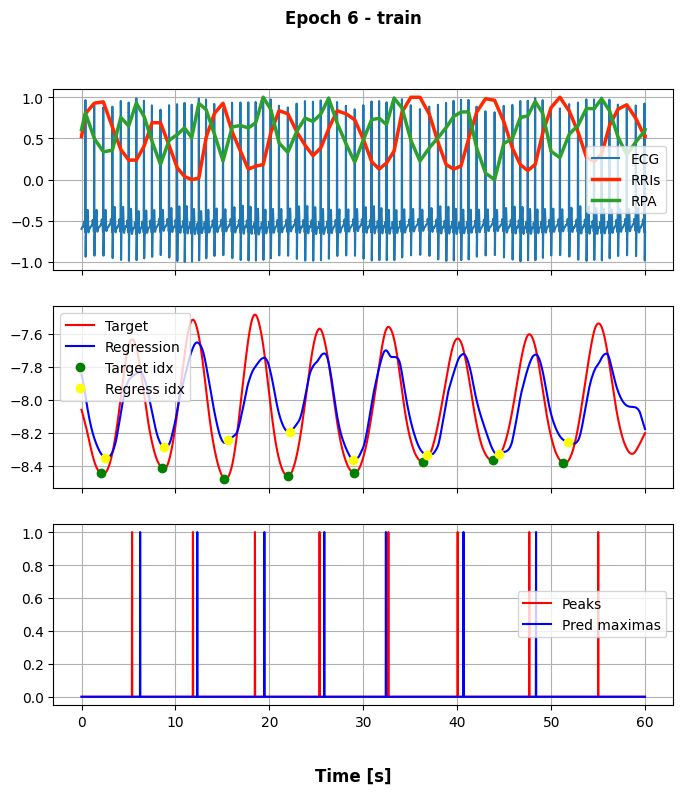

100%|██████████| 7/7 [00:01<00:00,  3.64it/s]


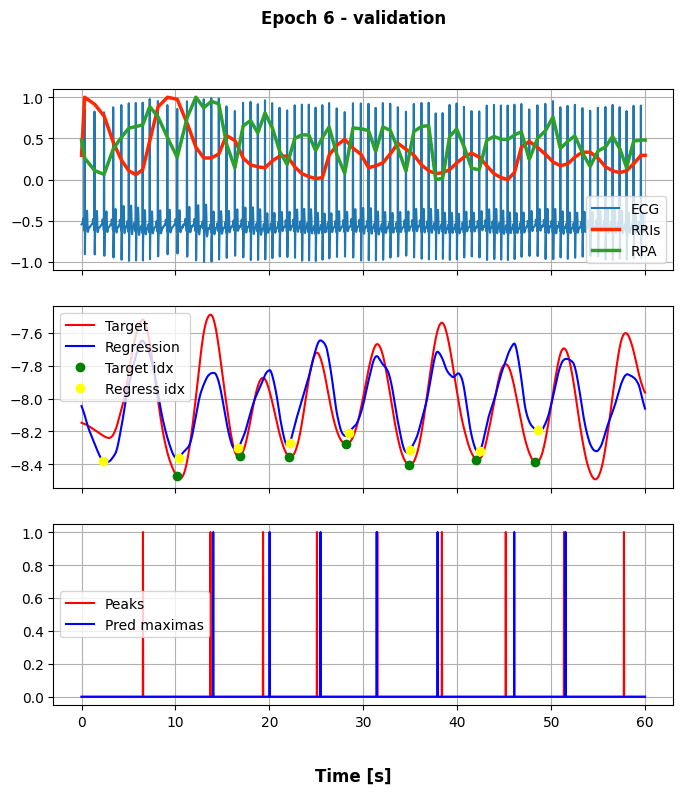

Epoch [6/10], LR: [0.001]
Avg train loss: 0.007831  |  Avg validation loss: 0.010015
Train NCC: 0.8779 | Val NCC: 0.8586


 86%|████████▌ | 6/7 [00:01<00:00,  4.89it/s]

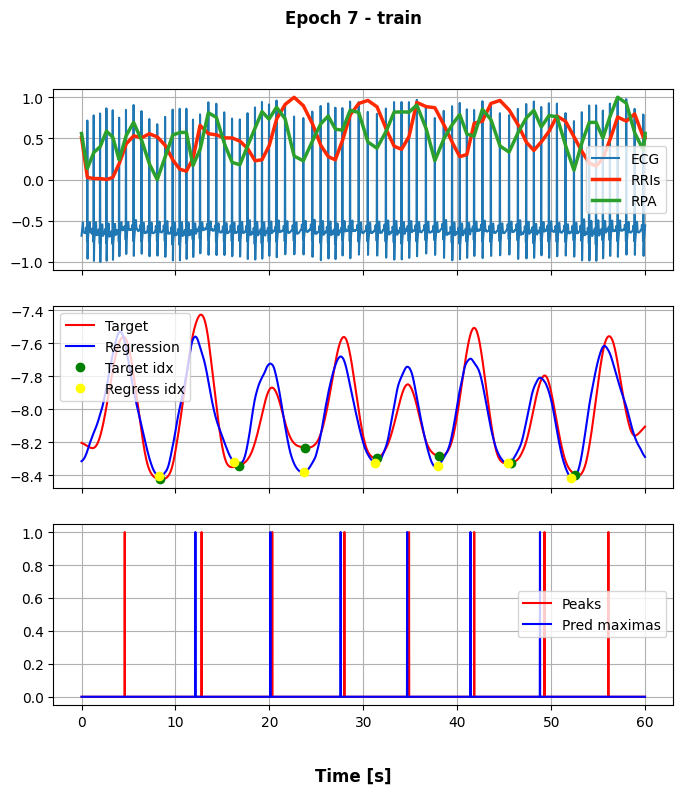

100%|██████████| 7/7 [00:02<00:00,  3.26it/s]


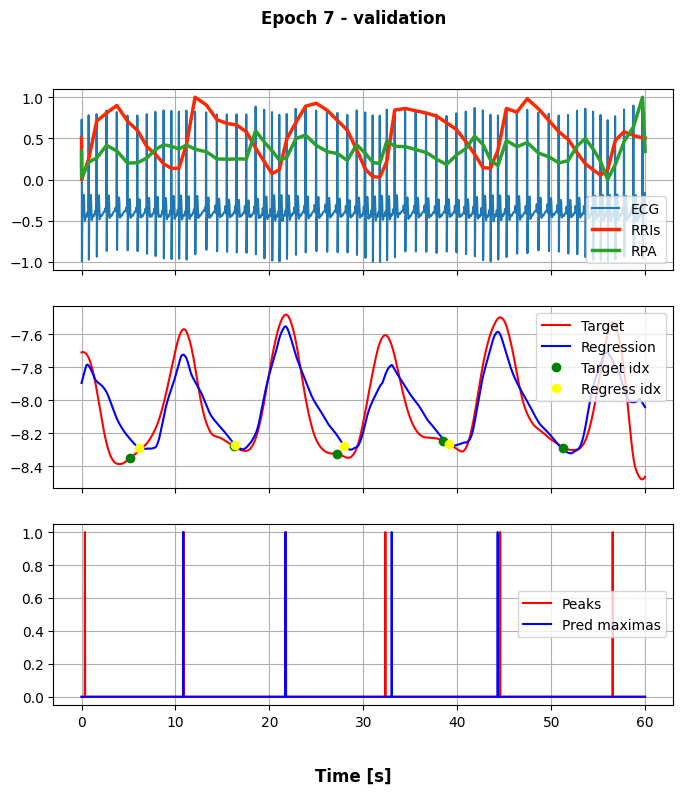

Epoch [7/10], LR: [0.001]
Avg train loss: 0.007300  |  Avg validation loss: 0.009916
Train NCC: 0.8859 | Val NCC: 0.8584


 86%|████████▌ | 6/7 [00:01<00:00,  4.89it/s]

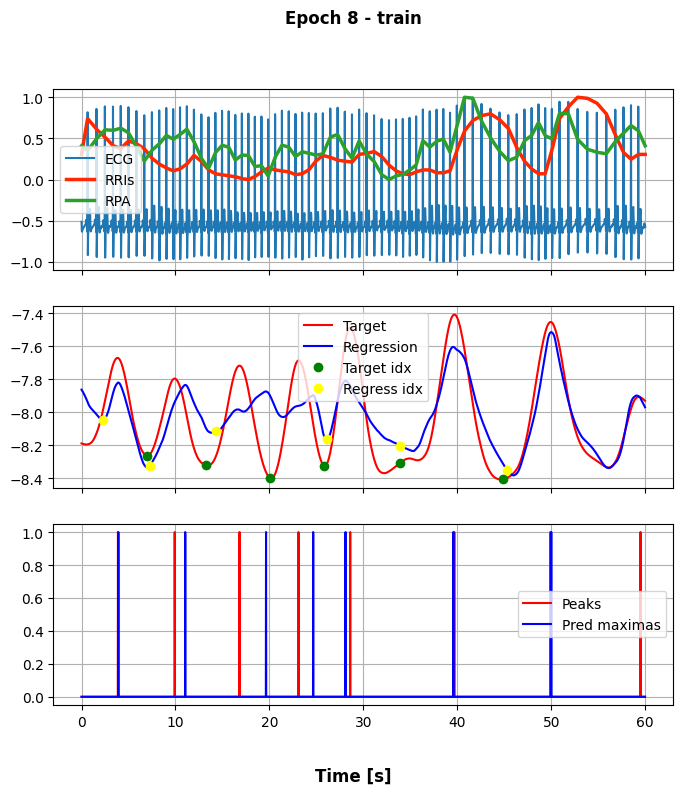

100%|██████████| 7/7 [00:01<00:00,  3.68it/s]


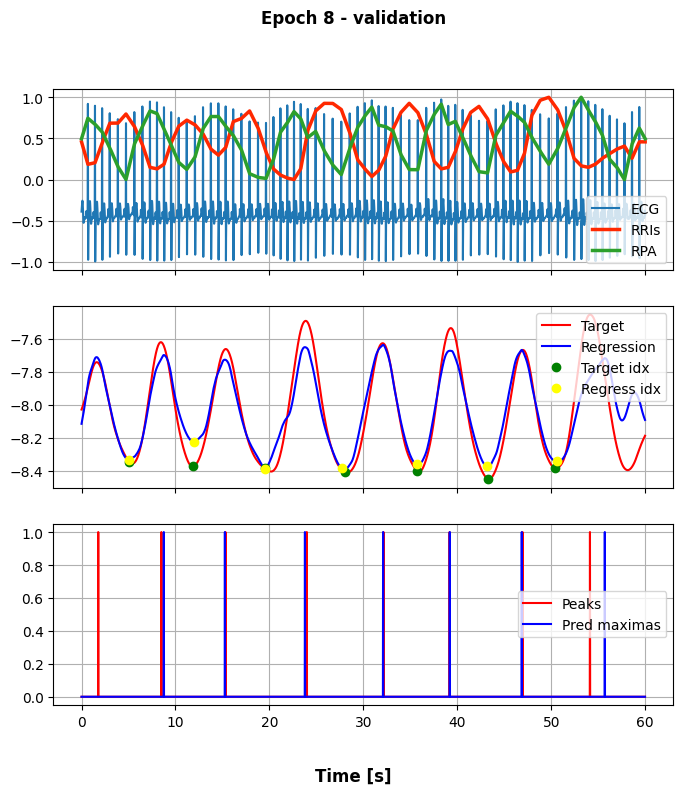

Epoch [8/10], LR: [0.001]
Avg train loss: 0.007421  |  Avg validation loss: 0.010255
Train NCC: 0.8830 | Val NCC: 0.8528


 86%|████████▌ | 6/7 [00:01<00:00,  4.88it/s]

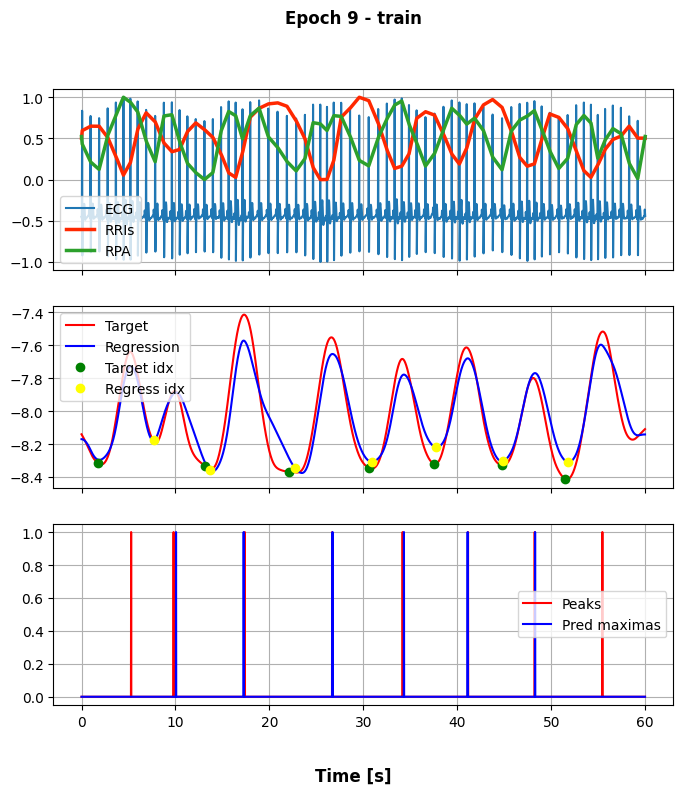

100%|██████████| 7/7 [00:02<00:00,  3.40it/s]


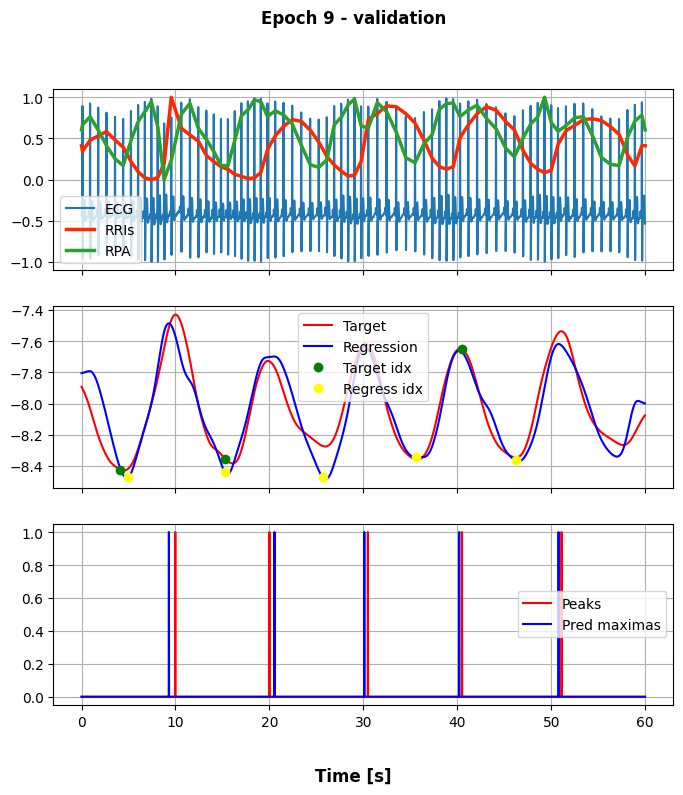

Epoch [9/10], LR: [0.001]
Avg train loss: 0.008731  |  Avg validation loss: 0.011309
Train NCC: 0.8849 | Val NCC: 0.8551


 86%|████████▌ | 6/7 [00:01<00:00,  4.95it/s]

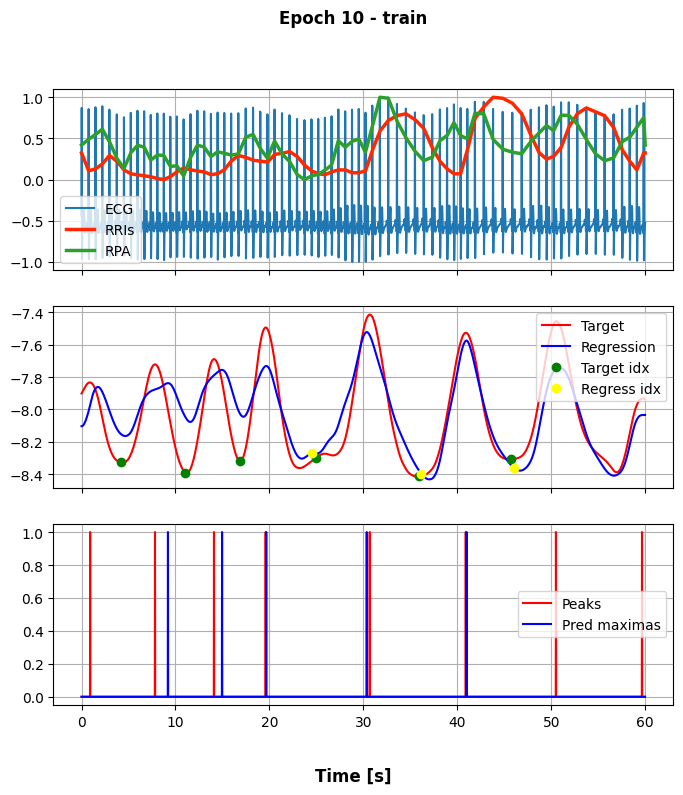

100%|██████████| 7/7 [00:02<00:00,  3.49it/s]


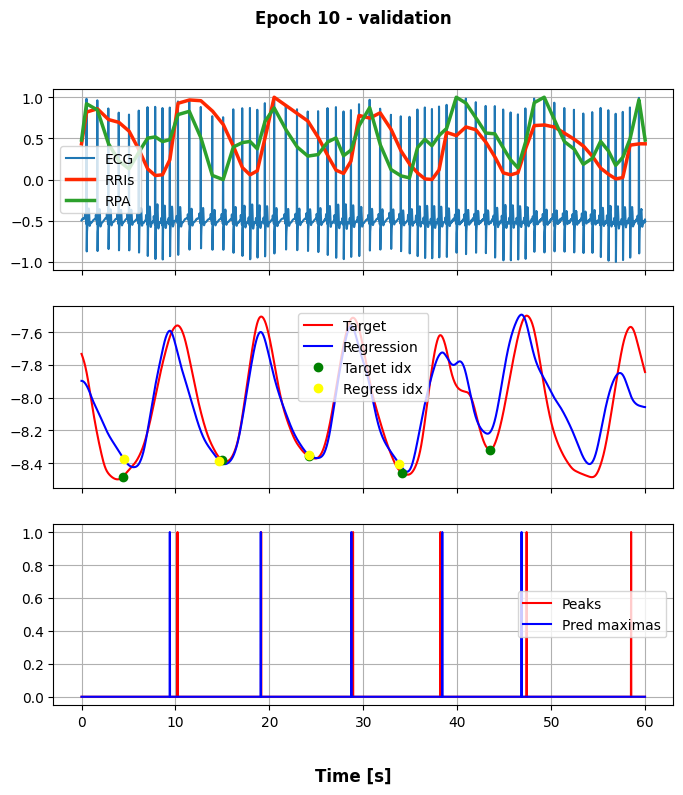

Epoch [10/10], LR: [0.001]
Avg train loss: 0.008368  |  Avg validation loss: 0.010849
Train NCC: 0.8890 | Val NCC: 0.8632
Early stopping


In [20]:
model, metrics = train(model=model, train_loader=train_8_loader, val_loader=val_loader, learning_rate=0.001, epochs=10, alfa=1)

In [47]:
torch.save(model.state_dict(), "./checkpoints/resp/downsampling/regession_model_3_channels_ecg_full_dataset.pt")
with open("./checkpoints/resp/downsampling/metrics_3_channels_ecg_full_dataset.pkl", "wb") as f:
   pickle.dump(metrics, f)

### Test

In [21]:
test_files = [x for x in os.listdir(test_path) if not os.path.isdir(root_path + "//" + x)]

ecgs = [os.path.join(test_path, x) for x in test_files[0::4]]
cycles =  [os.path.join(test_path, x) for x in test_files[1::4]]
resps =  [os.path.join(test_path, x) for x in test_files[2::4]]
annotations =  [os.path.join(test_path, x) for x in test_files[3::4]]

assert len(test_files) == len(ecgs) + len(resps) + len(annotations) + len(cycles)
assert (len(ecgs) + len(resps) + len(annotations) + len(cycles)) % 4 == 0

In [30]:
x_test, y_test = prepare_x_y_windows(window_in_seconds=120, windows_overlap_factor=0.85)
x_test = add_new_ecg_channels(x_test, detector="lstm")

End mismatch detected.
Training will be performed with: cuda:0


e:\anaconda3\envs\torch\Lib\site-packages\torch\nn\modules\rnn.py:88: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.3 and num_layers=1
  warnings.warn("dropout option adds dropout after all but last "
C:\Users\patry\AppData\Local\Temp\ipykernel_11272\2379129619.py:13: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `t

In [31]:
test_dataset = DeviceDataset(data=x_test, labels=y_test)
test_loader = DataLoader(dataset=test_dataset, batch_size=1)

In [32]:
def test(model, test_loader, alfa=0.5):
    model.eval()  # Set the model to evaluation mode
    criterion_1 = nn.L1Loss()
    criterion_2 = nn.KLDivLoss(reduction="batchmean", log_target=True)
    metric_criterion = NCC()

    epoch_test_loss = 0.0
    epoch_kldiv_loss = 0.0
    epoch_l1_loss = 0.0
    metric_value = 0.0

    with torch.no_grad():
        for batch_idx, (inputs, targets) in enumerate(test_loader):
            # Forward pass
            outputs = model(inputs)
            outputs = outputs.unsqueeze(-1)
            outputs = outputs.permute((0,2,1))
            outputs = F.conv1d(outputs, weight=smoothening_kernel)
            outputs = F.pad(outputs, (padding_amount, padding_amount), mode='replicate')
            outputs = outputs.permute((0,2,1))
            outputs = outputs.squeeze(-1)

            # Compute the loss
            loss_1 = criterion_1(outputs, targets[:,:,0])
            loss_2 = criterion_2(outputs, targets[:,:,0])

            metric_value += metric_criterion(outputs, targets[:,:,0])
            loss = (1-alfa) * loss_1 + alfa * loss_2


            epoch_l1_loss += loss_1.item()
            epoch_kldiv_loss += loss_2.item()
            epoch_test_loss += loss.item()

            # if epoch > 7:
            #     a, b, c = calculate_peak_misalignment(targets[:,:,0], outputs)
            #     peak_misalignment += a
            #     total_target_resp_peaks += b
            #     total_pred_resp_peaks += c
            # d, e = calculate_cycle_time_deviation(targets, outputs, 50)
            #     cycle_time_deviation += d
            #     matching_cycles += e

            
            plot_result(f"Example {batch_idx + 1}", inputs, targets, outputs)
    
    print(
            f"Test loss: {epoch_test_loss:<6.4f}\n"
            f"Test NCC: {metric_value / len(test_loader):<6.4f}"
        )

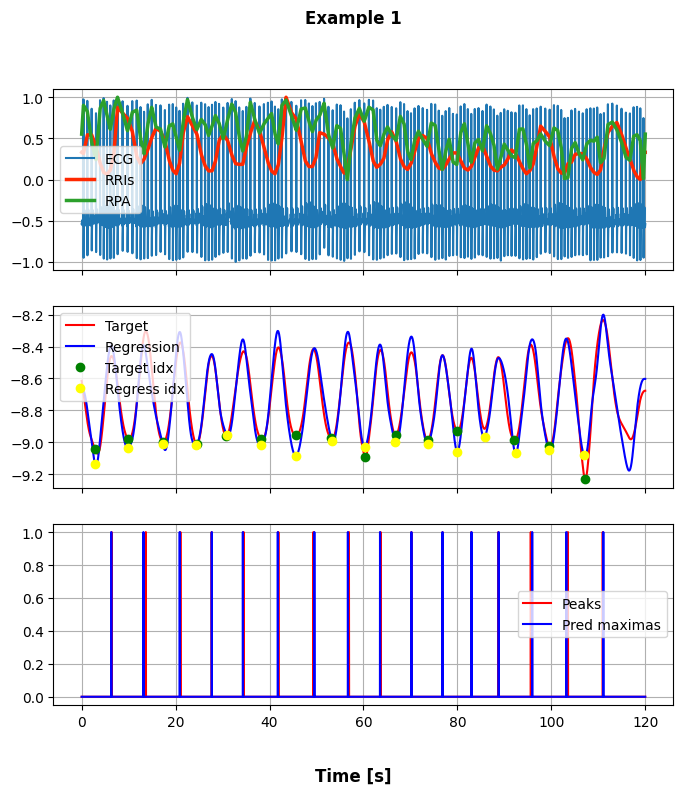

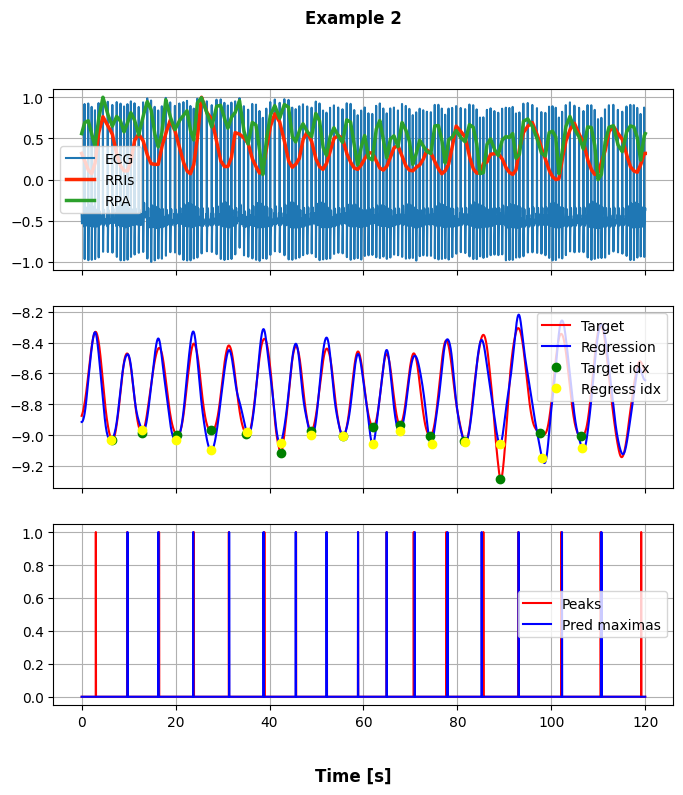

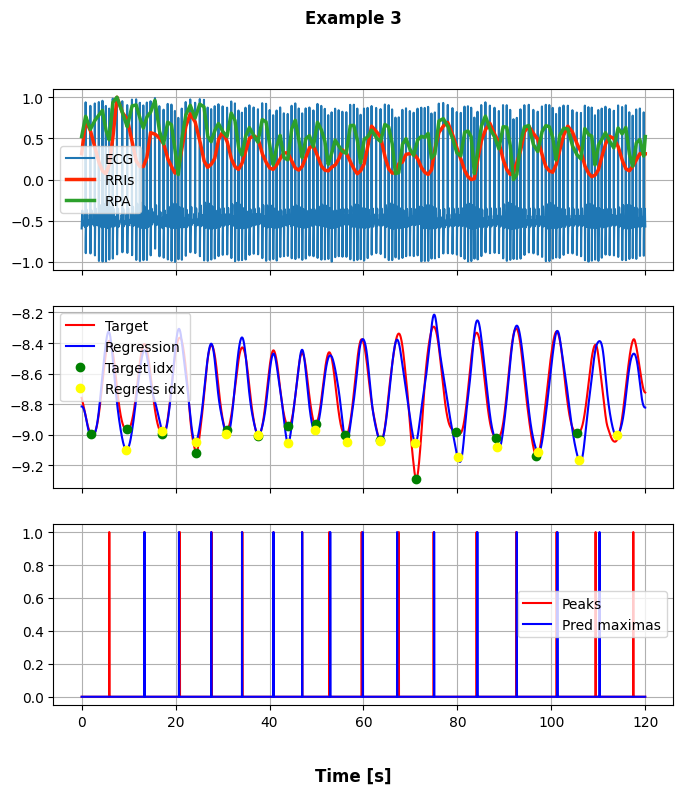

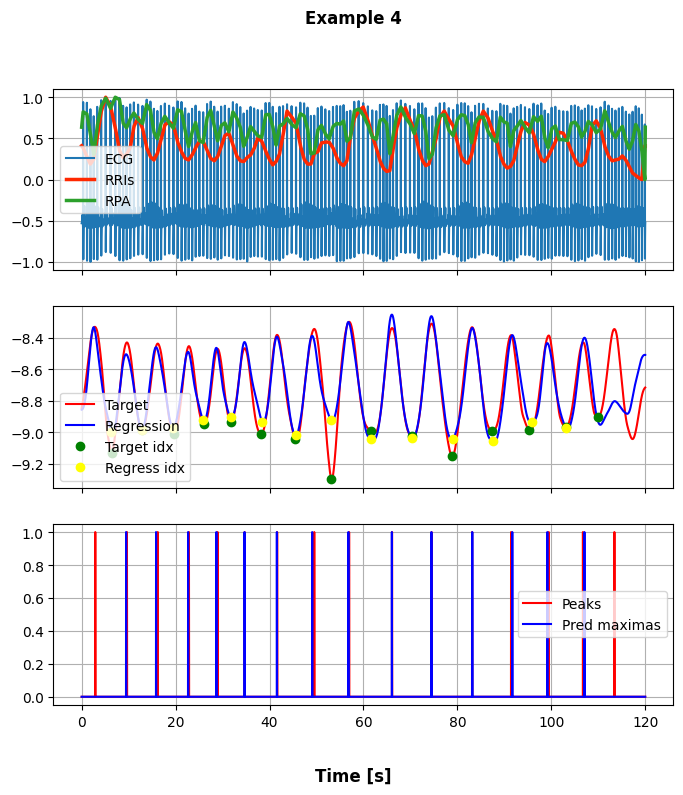

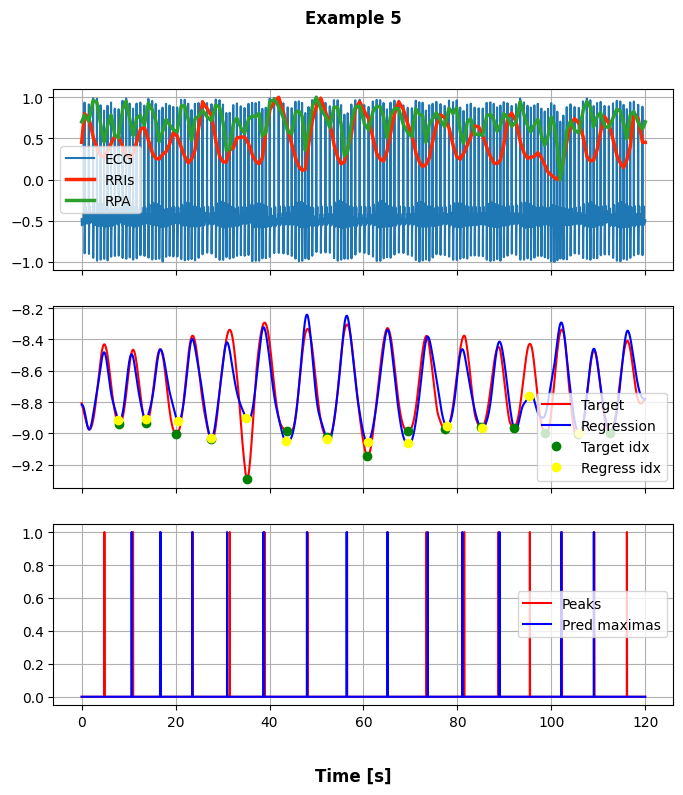

...

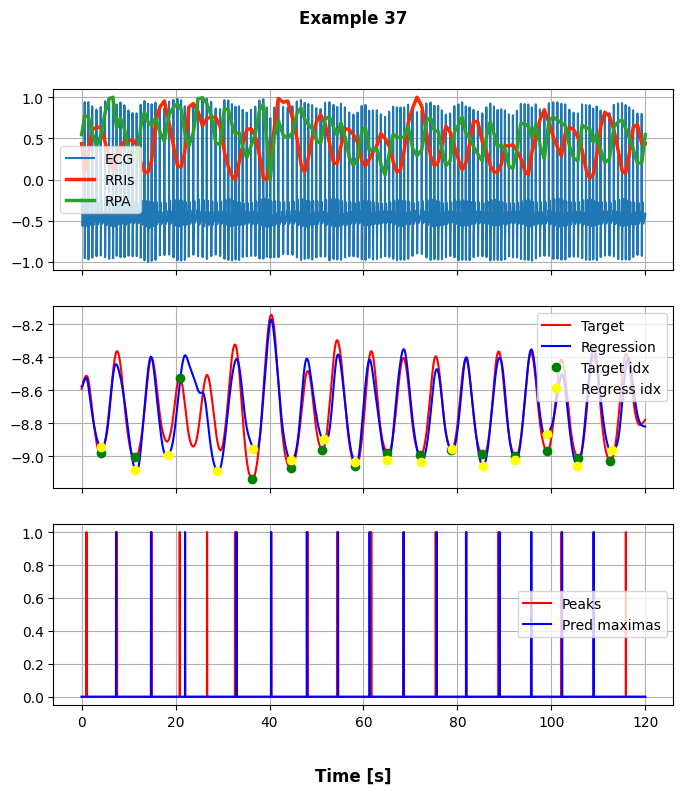

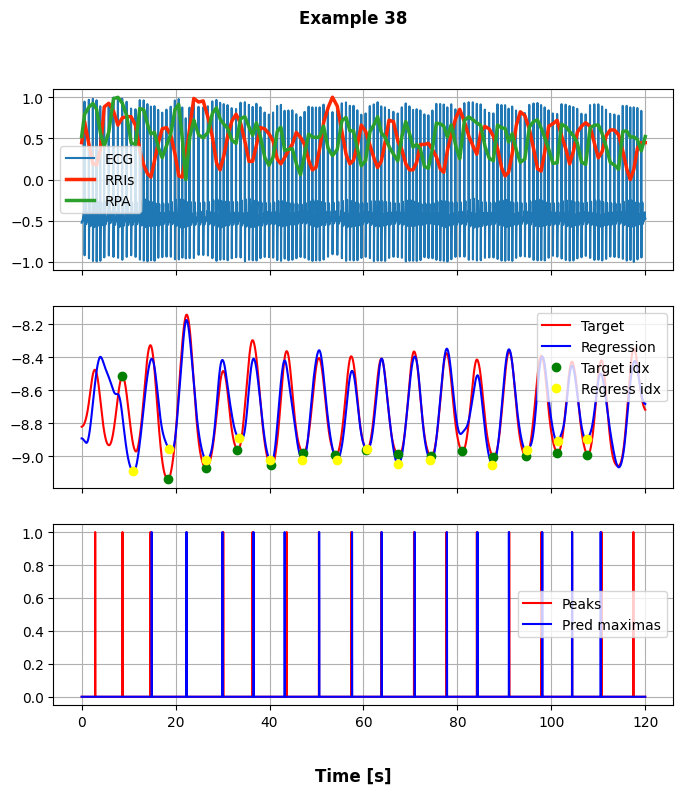

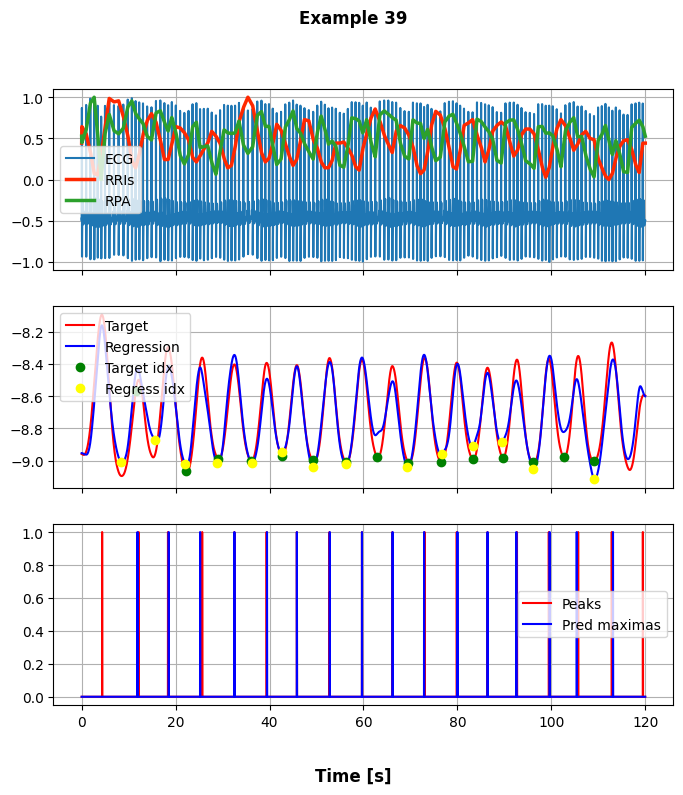

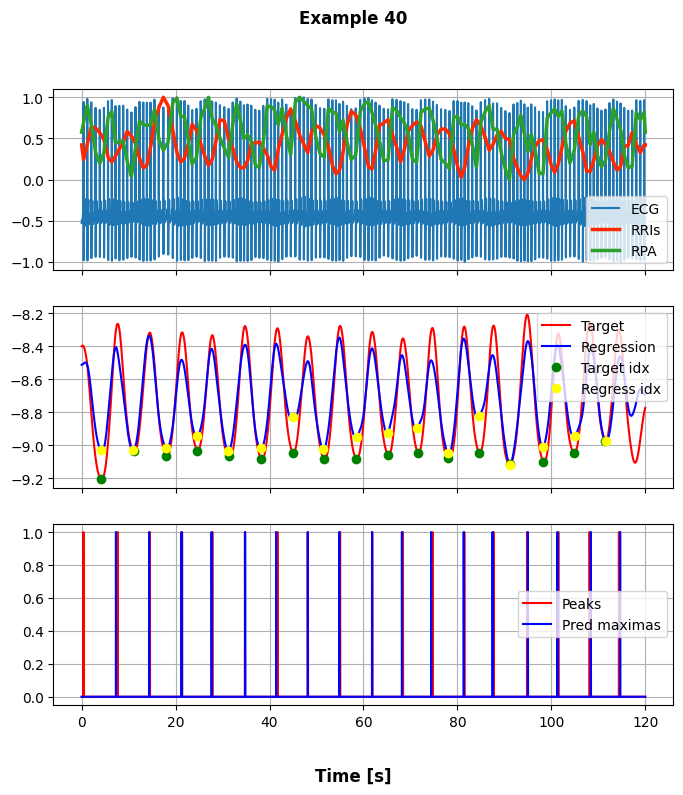

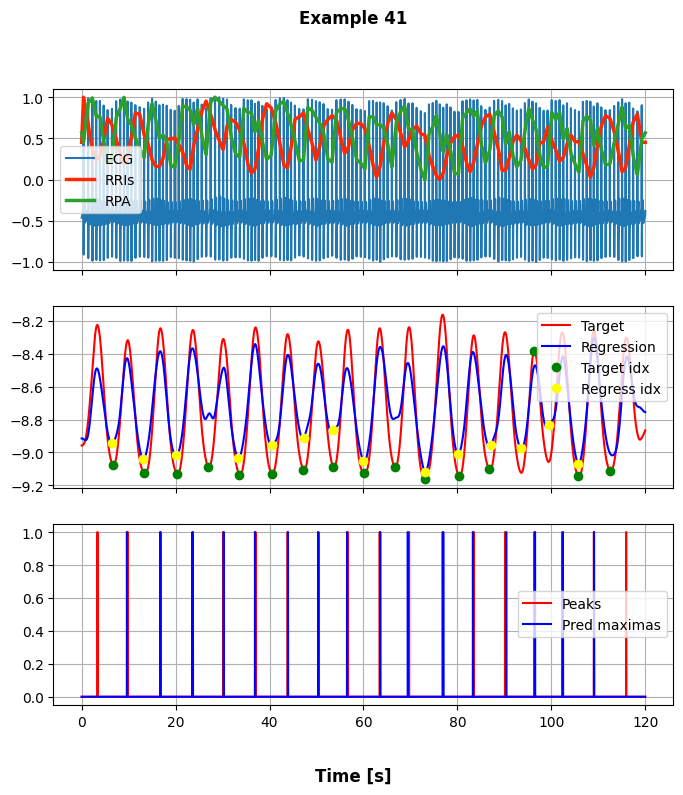

KeyboardInterrupt: 

In [33]:
test(model, test_loader, alfa=0.9)